In [1]:
import numpy as np # linear algebra
import os
import matplotlib
matplotlib.use('Agg')
%matplotlib inline
import matplotlib.pyplot as plt
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from pandas import Series, DataFrame
from netCDF4 import Dataset
from math import log10
from scipy import interpolate
import cartopy.crs as ccrs
import cartopy.feature as cfeature
import warnings
warnings.filterwarnings("ignore")
import seaborn as sns
from datetime import timedelta
from datetime import datetime
import numpy.ma as ma
import scipy as sp

# Active simulations

In [9]:
def calc_stat_figs(region, yyyy, mm, dd, fn, lb, day_tot):

    ##### Parameters and file names

    t_flight = [day_tot / 2, day_tot]
    #     t_flight = [0.5, 1.5]

    casename  = 'NEP_' + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}"

    traj_dirc = ['forward'] # trajectory direction, options: ['forward'], or  ['forward', 'backward']

    ##### read various files and variables 
    # forcing_fname = 'Forcings_NEP_'    + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}" + '.nc'
    forcing_fname = '/home/disk/eos3/erfani/Data/NEP/prepare_files/Forcings_NEP_'    + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}" + '.nc'
    traj_for_fname= '../../../../Data/NEP/Lagrangian_project/st_72h_forward_'  + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}" + '.nc'
    traj_bck_fname= '../../../../Data/NEP/Lagrangian_project/sst_48h_backward_' + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}" + '.nc'
    init_time     = str(yyyy) + '-' + f"{mm:02n}" + '-' + f"{dd:02n}" + ' 00Z' # because startup is for 24 hours earlier...
    bdate_value   = nbdate_value = int(str(yyyy)[2:] + f"{mm:02n}" + f"{dd:02n}")
    
    forcing       = Dataset(forcing_fname)
    Traj_data     = Dataset(traj_for_fname)
    # Traj_datab   = Dataset(traj_bck_fname)

    #######
    myblue1 = (0.31560580108711567, 0.005345691264152297, 0.6167893813265289)
    myblue2 = (0, 0.5, 1)
    ls = ['-', '-', '-', '-', '-', '-', '-', '-']
    NN = len(fn)
    cc = [myblue1              , 'crimson'         , 'tab:green'         , 'deepskyblue'   , 'darkgoldenrod', 'forestgreen', 'hotpink', 'deepskyblue', 'tomato', 'darkviolet', 'darkgoldenrod']
    lw = ['3', '3', '3', '3', '3', '3', '3', '3']

    period   = ''
    ylim = 2000
    #xlim = 3.6
    levels = 5 # number of levels above inversion that will be included in MBL averages
    Rd_cp  = 0.286

    zen_cut = 70 # do not consider CERES/GOES variables, when zenith angle is greater than cut-off

    ###
    idx_calday = 0


    ################################################################################
    #### Define required functions for calculations of variables:

    ## find delta after calculating mid-point values
    def delta(THETA):
        nz = THETA.shape[1]
        THETAi = np.arange(THETA.shape[0] * (nz+1)).reshape(THETA.shape[0], nz+1).astype(float)
        THETAi[:] = np.nan
        THETAi[:,0] = 0
        THETAi[:,1:nz] = 0.5 * (THETA[:,:nz-1] + THETA[:,1:nz])
        THETAi[:,nz] = 1.5 * THETA[:,nz-1] - 0.5 * THETA[:,nz-2]
        d_THETA = THETAi[:,1:] - THETAi[:,:-1]
        return d_THETA

    def inv_h(THETA, RH, dzz, zz):        
        d_THETA = THETA[:,1:] - THETA[:,:-1]
        d_RH = RH[:,1:] - RH[:,:-1]

        ZINV = d_THETA[:,0].copy()
        ZINV[:] = np.nan
        for i in range(d_THETA.shape[0]):
            z  = zz[i,:]  if len(zz.shape) > 1 else zz
            dz = dzz[i,:] if len(zz.shape) > 1 else dzz
            dTHETA_dz = d_THETA[i,:] / dz[1:]
            dRH_dz = d_RH[i,:] / dz[1:]
            dTHETA_dz[dTHETA_dz < 0] = 0
            dRH_dz[dRH_dz > 0] = 0    
            idz = np.where(z < 4000)[0]-1
            func = (dTHETA_dz * dRH_dz)[idz]
            if len(zz.shape) > 1:
                indx = np.max(np.where(func == np.nanmin(func))[0])
            else:
                indx = np.min(np.where(func == np.nanmin(func))[0])                    
            # approximate func as a parabola around the minimum and find the height where that parabola is minimized. 
            # This will allow the inversion height to vary continuously as the input profiles change.
            # inversion_test is defined at midpoints of grid
            zavg = 0.5 * (z[:-1] + z[1:])[idz]
            rnge = range(indx-1, indx+2)
            # we define the parabola, converting from m to km.
            pp = np.polyfit(1e-3 * zavg[rnge], func[rnge], 2)
            # take the derivative of the parabola in coeffient space.
            pp_prime = np.array([2 * pp[0], pp[1]]) # this is its derivative
            # find the zero-crossing of the derivative. This is the inversion height in meters
            z_inv = -1e3 * pp_prime[1] / pp_prime[0]
            ZINV[ZINV < 0] = 0
            ZINV[i] = z_inv
        return ZINV

    def mbl_ave_MERRA(MERRA_Na, MERRA_H, dz_MERRA, MERRA_RHO, ERA_ZINV):
        MERRA_Na_mean2 = MERRA_Na[:,0].copy()
        MERRA_Na_mean2[:] = np.nan
        for i in range(MERRA_Na_mean2.size):
            jjj = np.where(abs(MERRA_H[i,:] - ERA_ZINV[i]) == np.nanmin(abs(MERRA_H[i,:] - ERA_ZINV[i])))[0][0]
            MERRA_Na_mean2[i] = np.nansum(MERRA_RHO[i,jjj:] * MERRA_Na[i,jjj:] * dz_MERRA[i,jjj-1:])\
            / np.nansum(MERRA_RHO[i,jjj:] * dz_MERRA[i,jjj-1:])
        return MERRA_Na_mean2

    ## Find the index of model time when aircraft passes
    def model_index(time, t_flight):
        iii = np.where(abs(time - t_flight - time[0]) == np.nanmin(abs(time - t_flight - time[0])))[0][0]
        return iii


    # calc. Accumulated Precip.
    def calc_acc_R(R):
        acc_R = R.copy()
        acc_R[:] = np.nan
        for i in range(len(acc_R)):
            acc_R[i] = np.nansum(R[:i+1]) / (time[-1] * 24) 
        return acc_R

    # Calc. LTS
    def calc_LTS(THETA, P):
        indx = np.where((P <= 701) & (P >= 699))[0]

        theta_700 = np.nanmean(THETA[:,indx], 1)
        theta_sfc = THETA[:, 0]
        LTS = theta_700 - theta_sfc
        return LTS

    def mbl_ave_N(NA, RHO, dz, inv_idx):
    #    integ_NA_BL = np.arange(NAd[:,0].size)
        integ_NA_BL = NA[:,0].copy()    
        integ_NA_BL[:] = np.nan
        for i in range(NA[:,0].size):
            dz2 = dz.copy()
            mmm = np.where(np.isnan(NA[i,:]) == 1)[0]
            if len(mmm) > 0:
                dz2[mmm] = np.nan
            mmm2 = np.where(NA[i,:] <= 1)[0]
            if (len(mmm2) > 0 and len(mmm2) != len(NA)):
                dz2[mmm2] = np.nan            
            integ_NA_BL[i] = np.nansum(RHO[i,:inv_idx[i]] * dz2[:inv_idx[i]] * NA[i,:inv_idx[i]]) / np.nansum(RHO[i,:inv_idx[i]] * dz2[:inv_idx[i]])
        return integ_NA_BL


    def smooth(y, box_pts):
        box = np.ones(box_pts)/box_pts
        y_smooth = np.convolve(y, box, mode='same')
        return y_smooth


    ## Concatenate a variable from forward and backward trajectories
    def read_var_1D(var_name):
        if traj_dirc == ['forward', 'backward']:
            var = np.concatenate( ( Traj_datab.variables[var_name][(-HH+1):], \
                                  Traj_data.variables[var_name][:]), axis=0)
        else:
            var = Traj_data.variables[var_name][:]
        return np.array(var)

    def read_var_2D(var_name):
        if traj_dirc == ['forward', 'backward']:
            var = np.concatenate( ( Traj_datab.variables[var_name][(-HH + 1):,:], \
                                  Traj_data.variables[var_name][:]), axis=0)
        else:
            var = Traj_data.variables[var_name][:]
        return np.array(var)


    ###############################
    # calculate modeled CBH
    def calc_CTH(CLD):
        SAM_CTH = CWP.copy()
        SAM_CTH[:] = np.nan
        for i in range(len(CWP)):
            if np.nanmax(CLD[i,:]) > 0:
                tmp = CLD[i,:] / np.nanmax(CLD[i,:]) # normalize cumulative cloud fraction by its maxmimum value
                idx = np.nanmax(np.where(tmp > 0.5)[0]) # median CTH: height where normalized cumulative cloud fraction crosses 0.5
                SAM_CTH[i] = z[idx]
        return SAM_CTH

    def calc_CBH(CLD):
        SAM_CBH = CWP.copy()
        SAM_CBH[:] = np.nan
        for i in range(len(CWP)):
            if np.nanmax(CLD[i,:]) > 0:
                tmp = CLD[i,:] / np.nanmax(CLD[i,:]) # normalize cumulative cloud fraction by its maxmimum value
                idx = np.nanmin(np.where(tmp > 0.5)[0]) # median CTH: height where normalized cumulative cloud fraction crosses 0.5
                SAM_CBH[i] = z[idx]
        return SAM_CBH

    def calc_idx_CBH(SAM_CBH):
        idx_CBH = SAM_CBH.copy().astype(int)
        for i in range(len(idx_CBH)):
            tmp = np.where( abs(SAM_CBH[i] - z) == np.nanmin( abs(SAM_CBH[i] - z) ) )[0][0]
            idx_CBH[i] = tmp
        return idx_CBH

    def calc_prec_CB(PRECIP, idx_CBH):
        prec_CB = SAM_CBH.copy()
        for i in range(len(prec_CB)):
            prec_CB[i] = PRECIP[i,idx_CBH[i]]
        return prec_CB

    #####
    def vert_p_to_z(ij):
        if ij == 0:
            ax = axis
        elif ij == 1:
            ax = axis[i]
        elif ij == 2:
            ax = axis[i,j]
        ax.set_yticks(ylabel_p[:]) 
        labels = [item.get_text() for item in ax.get_yticklabels()]
        for i1 in range(len(labels)):
            labels[i1] = ylabel_h[i1]
        ax.set_yticklabels(labels)


    ###############################################################################
    ##### Read variables
    ######## forcing file:
    day   = forcing.variables['day'][:] 
    calday= forcing.variables['calday'][:] 
    lat   =  forcing.variables['lat'][:]             # Surface Latent Heat Flux:
    lev_fo=  forcing.variables['lev'][:] / 100        # pressure, converted to mb
    #CTH   = forcing.variables['CTH'][:] * 1000       # MODIS cloud top height: converted to m
    #qinit = forcing.variables['qinit'][:] * 1000     # Water Vapor Mass Mixing Ratio from Idealized Aircraft Sounding: converted to g/kg
    #Tinit = forcing.variables['Tinit'][:]            # Absolute Temperature from Idealized Aircraft Sounding: K
    qref  = forcing.variables['qref'][:] * 1000      # Water Vapor Mass Mixing Ratio from from ERA-5: converted to g/kg
    qt_fo = forcing.variables['q'][:] * 1000         # Total Vapor Mass Mixing Ratio from from ERA-5: converted to g/kg
    Tref  = forcing.variables['Tref'][:]             # Absolute Temperature          from from ERA-5: K
    SST_fo= forcing.variables['Tg'][:]              # Surface Temperature (SST if over water): K
    u_fo  = forcing.variables['u'][:]              # Zonal Wind: m/s
    v_fo  = forcing.variables['v'][:]              # Meridional Wind: m/s
    z_forc=  forcing.variables['z'][:]               # Geopotential height from ERA-5:
    #shflx =  forcing.variables['shflx'][:]           # Surface Sensible Heat Flux:
    #lhflx =  forcing.variables['lhflx'][:]           # Surface Latent Heat Flux:
    Na_accm= forcing.variables['Na_accum'][:] / 1e6  # Accumulation mode aerosol number mixing ratio from MERRA2 (Corrected based on regression w/in situ CSET data)
    omega =  forcing.variables['omega'][:]           # Vertical Pressure Velocity: Pa/s
    fday = calday - int(calday[0])


    dummy, fday_mg = np.meshgrid(z_forc[0,:,0,0], fday) # making meshgrid
    lev_fo_mg, dummy = np.meshgrid(lev_fo, fday) # making meshgrid
    Theta_fo = Tref[:,:,0,0] * (1000 / lev_fo) ** (Rd_cp)


    ################### CERES
    CERES_zenith  = read_var_1D('CERES_solar_zen_angle_1h')   # Cloud Top Height - Low clouds    
    cut_var  = CERES_zenith.copy()
    cut_var[:] = 1.0
    cut_var[CERES_zenith > zen_cut] = np.nan

    CERES_lwp     = read_var_1D('CERES_lwp_low_1h') * cut_var      # Liquid Water Path - Low clouds: g/m2
    CERES_lwp_tot = read_var_1D('CERES_lwp_total_1h') * cut_var    # Liquid Water Path - total clouds: g/m2
    CERES_cld     = read_var_1D('CERES_cldarea_low_1h')   # Cloud Area Fraction - Low clouds: %
    CERES_cld_tot = read_var_1D('CERES_cldarea_total_1h') # Cloud Area Fraction - total clouds: %
    CERES_t_sw    = read_var_1D('CERES_toa_sw_all_1h')    # Observed TOA Shortwave Flux - All-sky: w/m2
    CERES_t_lw    = read_var_1D('CERES_toa_lw_all_1h')    # Observed TOA Longwave  Flux - All-sky: w/m2
    CERES_t_si    = read_var_1D('CERES_toa_solar_all_1h') # Observed TOA Solar Insolation Flux - All-sky: w/m2
    CERES_s_lwu   = read_var_1D('CERES_adj_atmos_lw_up_all_surface_1h')   # Adjusted All-Sky Profile Fluxes Longwave Flux Up - Surface: w/m2
    CERES_s_lwd   = read_var_1D('CERES_adj_atmos_lw_down_all_surface_1h') # Adjusted All-Sky Profile Fluxes Longwave Flux Down - Surface: w/m2
    CERES_s_swu   = read_var_1D('CERES_adj_atmos_sw_up_all_surface_1h')   # Adjusted All-Sky Profile Fluxes Shortgwave Flux Up - Surface: w/m2
    CERES_s_swd   = read_var_1D('CERES_adj_atmos_sw_down_all_surface_1h') # Adjusted All-Sky Profile Fluxes Shortwave Flux Down - Surface: w/m2
    #CERES_sw_cre  = read_var_1D('CERES_sw_cre')   # Shortwave Cloud Radiative Effect 
    #CERES_lw_cre  = read_var_1D('CERES_lw_cre')   # Longwave Cloud Radiative Effect 
    #CERES_net_cre = read_var_1D('CERES_net_cre')  # Net Cloud Radiative Effect 
    CERES_tau     = read_var_1D('CERES_cldtau_low_1h')    * cut_var    # Cloud Visible Optical Depth - Low clouds
    CERES_re      = read_var_1D('CERES_cldwatrad_low_1h') * cut_var    # 
    CERES_Nd      = read_var_1D('CERES_Nd')               * cut_var    # cm**-3      

    CERES_s_lw    = CERES_s_lwu - CERES_s_lwd
    CERES_s_sw    = CERES_s_swd - CERES_s_swu
    CERES_t_si2   = CERES_t_si.copy()
    CERES_t_si2[CERES_t_si2 <= 100] = np.nan
    CERES_albd    = (CERES_t_si2 - CERES_t_sw) / CERES_t_si2
    CERES_albd2   = CERES_t_sw / CERES_t_si2
    CERES_t_sw_std     = read_var_1D('CERES_toa_sw_all_1h_std')    # std of Observed TOA Shortwave Flux - All-sky: w/m2
    CERES_t_sw_clr     = read_var_1D('CERES_toa_sw_clr_1h')        # Observed TOA Shortwave Flux - Clear-sky: w/m2
    CERES_t_sw_clr_std = read_var_1D('CERES_toa_sw_clr_1h_std')    # std of Observed TOA Shortwave Flux - All-sky: w/m2

    CERES_sw_cre      = -CERES_t_sw + CERES_t_sw_clr 
    CERES_sw_cre_std  = abs(CERES_t_sw_std + CERES_t_sw_clr_std) 
    CERES_cld_std     = read_var_1D('CERES_cldarea_low_1h_std') # * cut_var  # std of Cloud Area Fraction - Low clouds: %
    CERES_lwp_std     = read_var_1D('CERES_cldarea_low_1h_std') * cut_var  # std of Liquid Water Path - Low clouds: g/m2
    CERES_cld_tot_std = read_var_1D('CERES_cldarea_total_1h_std')   # std of Cloud Area Fraction - total clouds: %
    CERES_lwp_tot_std = read_var_1D('CERES_cldarea_total_1h_std')   # std of Liquid Water Path - total clouds: g/m2
    CERES_t_lw_std    = read_var_1D('CERES_toa_lw_all_1h_std')    # Observed TOA Longwave Flux - All-sky, , standard deviation over box: w/m2
    CERES_toa_alb     = read_var_1D('CERES_toa_alb_all_1h')    
    CERES_toa_alb_std = read_var_1D('CERES_toa_alb_all_1h_std')    
    CERES_tau_std     = read_var_1D('CERES_cldtau_low_1h_std')    * cut_var   # Cloud Visible Optical Depth - Low clouds
    CERES_re_std      = read_var_1D('CERES_cldwatrad_low_1h_std') * cut_var # 

    CERES_CTH     = read_var_1D('CERES_cldhght_top_low_1h') * 1000   # Cloud Top Height - Low clouds
    CERES_CTH_std = read_var_1D('CERES_cldhght_top_low_1h_std') * 1000   #

    ### MODIS
    MODIS_CTH      = read_var_1D('MODIS_CTH')     * 1000   # MODIS cloud top height: converted to m
    MODIS_CTH_std  = read_var_1D('MODIS_CTH_std') * 1000   # MODIS cloud top height: converted to m


    ### SSMI
    SSMI_WVP   = read_var_1D('SSMI_WVP')   # Columnar Water Vapor: mm
    SSMI_lwp   = read_var_1D('SSMI_LWP')   # Cloud Liquid Water: mm
    SSMI_WSPD  = read_var_1D('SSMI_WSPD')  # 10m Surface Wind Speed
    SSMI_lwp_std = read_var_1D('SSMI_LWP_std')  # Cloud Liquid Water standard deviation over box: mm
    AMSR_lwp   = read_var_1D('AMSR_LWP')   # Cloud Liquid Water: mm
    AMSR_lwp_std = read_var_1D('AMSR_LWP_std')  # Cloud Liquid Water standard deviation over box: mm


    ################### MERRA
    # MERRA_time2  = np.concatenate( ( (Traj_datab.variables['time'][(-HH+1):] - Traj_datab.variables['time'][-HH+1]) / 24, \
    #                                   (Traj_data.variables['time'][:] + HH - 1) / 24), axis=0)
    if traj_dirc == ['forward', 'backward']:
        MERRA_time2 = np.array( np.concatenate( ( (Traj_datab.variables['time'][(-HH + 1):] - Traj_datab.variables['time'][-HH + 1]) / 24, \
                                      (Traj_data.variables['time'][:] + HH) / 24), axis=0) )
    else:
        MERRA_time2 = np.array( (Traj_data.variables['time'][:] + HH) / 24 )

    MERRA_RHO       = read_var_2D('MERRA_AIRDENS')    # air_density: kg/m3                     
    MERRA_Na        = read_var_2D('MERRA_Na_tot') / MERRA_RHO      # total aerosol from MERRA
    MERRA_Na_corr   = read_var_2D('MERRA_Na_tot_corr') / MERRA_RHO # total aerosol number concentration, >100 um, corrected to aircraft
    MERRA_H         = read_var_2D('MERRA_H')    # mid_layer_heights
    MERRA_prs       = Traj_data.variables['lev'][:]   #


    dz_MERRA        = MERRA_H.copy()
    dz_MERRA[:]     = np.nan
    dz_MERRA[:,1:]  = MERRA_H[:,:-1] - MERRA_H[:,1:]

    MERRA_H_mg, MERRA_time_mg = np.meshgrid(MERRA_H[0,:], MERRA_time2)    # making meshgrid
    


    ### AMSR
    AMSR_prec     = read_var_1D('AMSR_prcp_mean') * 24 # AMSR Tb mean rain rate: converted to mm/day
    AMSR_prec_std = read_var_1D('AMSR_prcp_std') * 24  # AMSR Tb rain rate standard deviation: : converted to mm/day

    ### ERA
    ERA_sshf = - read_var_1D('ERA_sshf')      # Instantaneous surface sensible heat flux: W/m2
    ERA_slhf = - read_var_1D('ERA_slhf')      # Instantaneous surface sensible heat flux: W/m2
    ERA_lcc  = read_var_1D('ERA_lcc') * 100   # Low cloud cover: convert to %
    ERA_lev  = np.array(Traj_data.variables['level'][:]) # air_pressure: mb
    ERA_z    = read_var_2D('ERA_z') / 10      # geopotential: converted from m**2 s**-2 to m
    ERA_t    = read_var_2D('ERA_t')           # air_temperature: K
    ERA_q    = read_var_2D('ERA_q') * 1000    # specific_humidity: converted to g/kg
    ERA_r    = read_var_2D('ERA_r')           # relative_humidity: %
    ERA_LTS  = read_var_1D('ERA_LTS')         # Lower Tropospheric Stability: K
    ERA_blh  = read_var_1D('ERA_blh')         # oundary layer height: m
    ERA_cc   = read_var_2D('ERA_cc') * 100    # Fraction of cloud cover: converted to %
    ERA_crwc = read_var_2D('ERA_crwc') * 1000 # Specific rain water content: converted to g kg**-1
    ERA_clwc = read_var_2D('ERA_clwc') * 1000 # Specific cloud water content: converted to g kg**-1
    ERA_wc   = ERA_crwc + ERA_clwc            # liquid water mixing ratio (rain water + liquid cloud water)
    ERA_qt   = ERA_wc   + ERA_q


    ####
    ERA_z_mg, ERA_time_mg = np.meshgrid(ERA_z[0,:], MERRA_time2) # making meshgrid
    ERA_lev_mg, dummy = np.meshgrid(ERA_lev, MERRA_time2) # making meshgrid

    # calculate ERA5 Theta:
    Rd_cp = 0.286
    ERA_THETA = ERA_t * (1000 / ERA_lev_mg) ** (Rd_cp)

    MERRA_alt = np.nanmean(MERRA_H, 0)


    ## ERA5
    Cp = 1005.7 # specific heat of dry air at constant pressure: J/kg/K
    Lv = 2.5e6  # latent heat of vaporization: J/kg
    ERA_THETAL = ERA_THETA - (ERA_THETA / ERA_t) * (Lv / Cp) * ERA_wc / 1000

    ##############################  
    ## Calc. ERA inversion height
    #dz_ERA  = delta(ERA_z)
    dz_ERA  = ERA_z.copy()
    dz_ERA[:] = np.nan
    dz_ERA[:,1:] = ERA_z[:,1:] - ERA_z[:,:-1]
    # try:
    ERA_ZINV = inv_h(ERA_THETAL, ERA_r, dz_ERA, ERA_z)
    # except:
    #     pass
    # ERA_ZINV = ERA_blh

    ##Calculate the index of BL: find index where z is equal to ZINV
    MERRA_inv_idx = np.arange(len(ERA_ZINV))
    MERRA_inv_idx[:] = int(0)
    for i in range(len(ERA_ZINV)):
        diff = abs(MERRA_H[i,:] - ERA_ZINV[i])
        MERRA_inv_idx[i] = np.where(diff == np.min(diff))[0][0]  

        ##### Option to correct aerosol number and mass based on CERES Nd        
        ## CERES:
        CERES_zenith  = read_var_1D('CERES_solar_zen_angle_1h')   # Cloud Top Height - Low clouds    
        cut_var  = CERES_zenith.copy()
        cut_var[:] = 1.0
        cut_var[CERES_zenith > zen_cut] = np.nan
        CERES_Nd_tmp  = read_var_1D('CERES_Nd') * cut_var    # cm**-3  
        data_time = Traj_data.variables['time'][:]
        T_lev     = Traj_data.variables['lev'][:]    # model level pressure: mb       

        ## MERRA2:
        MERRA_RHO      = read_var_2D('MERRA_AIRDENS')    # air_density: kg/m3                     
        MERRA_H        = read_var_2D('MERRA_H')          # mid_layer_heights
        MERRA_Na_tot   = read_var_2D('MERRA_Na_tot') # / MERRA_RHO      # total aerosol from MERRA: converted to 1/kg      
        d_T_lev = T_lev.copy()
        d_T_lev[:] = np.nan
        d_T_lev[1:] = T_lev[1:] - T_lev[:-1]

        ## MBL-mean MERRA2 Na
        MERRA_Na_tot_mean = MERRA_Na_tot[:,0].copy()
        for ij in range(len(MERRA_Na_tot_mean)):
            idx_inv_2 = np.where( abs(MERRA_H[ij,:] - ERA_ZINV[ij]) == np.nanmin( abs(MERRA_H[ij,:] - ERA_ZINV[ij]) ) )[0][0]
            MERRA_Na_tot_mean[ij] = np.nansum(MERRA_Na_tot[ij,idx_inv_2:] * MERRA_RHO[ij,idx_inv_2:] * d_T_lev[idx_inv_2:] )\
            / np.nansum(MERRA_RHO[ij,idx_inv_2:] * d_T_lev[idx_inv_2:])

        ## First day:
        CERES_Nd_tmp = CERES_Nd_tmp[:24]
        MERRA_Na_tot_mean = MERRA_Na_tot_mean[:24]
        data_time = data_time[:24]
        ## instances of non-nan CERES Nd:
        idx_nonan = np.where(np.isnan(CERES_Nd_tmp) == 0)
        CERES_Nd_tmp = CERES_Nd_tmp[idx_nonan]
        MERRA_Na_tot_mean = MERRA_Na_tot_mean[idx_nonan] 

        F_c = (5 / 4) * np.nanmean(CERES_Nd_tmp) / np.nanmean(MERRA_Na_tot_mean)
    
        for ij in range(len(MERRA_Na)):
            idx_inv_2 = np.where( abs(MERRA_H[ij,:] - ERA_ZINV[ij]) == np.nanmin( abs(MERRA_H[ij,:] - ERA_ZINV[ij]) ) )[0][0]
            MERRA_Na[ij,idx_inv_2:] = MERRA_Na_tot[ij,idx_inv_2:] * F_c
        idx_inv = np.where( abs(MERRA_H[0,:] - ERA_ZINV[0]) == np.nanmin( abs(MERRA_H[0,:] - ERA_ZINV[0]) ) )[0][0]
#         print('Correcting MERRA Na: ', F_c, CERES_Nd_tmp[0], MERRA_Na_tot_mean[0], np.nanmean(MERRA_Na[0,idx_inv:]))
#         print(MERRA_H[0,:])

    ############################################
    ##### Calculate ERA5 water path
    def ERA_LWP(var, ERA_z):
        delta_ERA_z = delta(ERA_z[:,::-1])[:,::-1]
        #delta_ERA_z = ERA_z[:,0:-1] - ERA_z[:,1:]
        ERA_lwp = var[:,0].copy()
        ERA_lwp[:] = np.nan
        ERA_RHO = var.copy()
        ERA_RHO[:] = np.nan
        for i in range(ERA_RHO.shape[0]):
            ERA_RHO[i,:] = np.interp(ERA_z[i,:], MERRA_H[i,:], MERRA_RHO[i,:])
        for i in range(delta_ERA_z.shape[0]):
            ERA_lwp[i] = np.nansum(var[i,:] * delta_ERA_z[i,:] * ERA_RHO[i,:]) # / np.nansum(delta_ERA_z2[i, :])
        return ERA_lwp

    ERA_clwp = ERA_LWP(ERA_clwc, ERA_z)
    ERA_crwp = ERA_LWP(ERA_crwc, ERA_z)


    ############################################
    ### Time series and vertical profiles
    xlim = MERRA_time2[-1]

    lngh = 10
    box = 5
    ERA_c = 'k'

    ##### Calculate accumulated AMSR prec
    delta_d  = 0.5
    accm     = 0
    accm_std = 0
    AMSR_prec_accm        = AMSR_prec.copy()
    AMSR_prec_accm[:]     = np.nan
    AMSR_prec_accm_std    = AMSR_prec.copy()
    AMSR_prec_accm_std[:] = np.nan

    cints = np.arange(0,int(MERRA_time2[-1])+1.5, delta_d)
    for i in range(len(cints)-1):
        i_d = np.where((MERRA_time2 - MERRA_time2[0] > cints[i]) & (MERRA_time2 - MERRA_time2[0] < cints[i] + delta_d))[0]
        if np.isnan( np.nanmean(AMSR_prec[i_d]) ) != 1: 
            accm    += np.nanmean(AMSR_prec[i_d]) * delta_d
            accm_std = np.nanmean(AMSR_prec_std[i_d])
        else:
            accm    += accm #* delta_d
            accm_std = accm_std
        AMSR_prec_accm[i_d]     = accm
        AMSR_prec_accm_std[i_d] = accm_std


    ## Calculate liquid water static energy divided by Cp
    Cp = 1005.7 # specific heat of dry air at constant pressure: J/kg/K
    Lv = 2.5e6  # latent heat of vaporization: J/kg
    g  = 9.81   # gravitation

    ERA_lwc  = ERA_crwc + ERA_clwc             # liquid water mixing ratio (rain water + liquid cloud water)

    ERA_Tl = ERA_t + g * ERA_z / Cp - (Lv / Cp) * ERA_lwc / 1000


    #####################################################################################
    def read_model_vars(file):
        ## model variables:
        TIME = file.variables['time'][:]
        #lat_mg, lon_mg = np.meshgrid(lat, lon) # making meshgrid
        # 1-D variables
        z       = file.variables['z'][:]
        SST     = file.variables['SST'][:] - 273.15     # sea surface temperature converted from kelvin to celcius unit
        SSTOBS  = file.variables['SSTOBS'][:] - 273.15 
        PREC    = file.variables['PREC'][:]             # Surface Precipitation"  "mm/day" 
        LHF     = file.variables['LHF'][:]
        LHFOBS  = file.variables['LHFOBS'][:]
        SHF     = file.variables['SHF'][:]
        SHFOBS  = file.variables['SHFOBS'][:]
        Ps      = file.variables['Ps'][:]
        LWNS    = file.variables['LWNS'][:]
        SWNS    = file.variables['SWNS'][:]
        RWP     = file.variables['RWP'][:]       # Rain Water Path: g/m2
        CWP     = file.variables['CWP'][:]       # Cloud Water Path
        LWP     = file.variables['LWP'][:]       # GCSS Liquid Water Path
        MODISLWP= file.variables['MODISLWP'][:]
        CLDLOW  = file.variables['CLDLOW'][:]
        # SAM's CLDLOW variable uses a threshold for cloud fraction that is based on LWP (20 g/m2, when CEM=.true., as in these runs) 
        # which may not be consistent with an optical-depth-based threshold, as would be used in a satellite product.
        CLDMID  = file.variables['CLDMID'][:]
        CLDHI   = file.variables['CLDHI'][:]
        MODISREL= file.variables['MODISREL'][:]   # MODIS Effective Radius (Liquid): mkm
        ISCCPLOW= file.variables['ISCCPLOW'][:] 
        # The ISCCP simulator approximates the cloud fraction that would be observed by a satellite using an optical depth threshold
        # of 0.3. The model domain includes only the lower troposphere, so that the relevant ISCCPTOT and ISCCPLOW should be identical.  
        ISCCPTOT= file.variables['ISCCPTOT'][:] # 
        ZINV_org= file.variables['ZINV'][:]       # inversion height (km)
        WMAX    = file.variables['WMAX'][:]       # max updraft vel. (m/s)
        LWNTOA  = file.variables['LWNTOA'][:]     # Net LW flux at TOA (w/m2)
        SWNTOA  = file.variables['SWNTOA'][:]     # Net SW flux at TOA (w/m2)
        SOLIN   = file.variables['SOLIN'][:]      # Incoming SW flux at TOA (w/m2)
        ISCCPALB= file.variables['ISCCPALB'][:]   # ISCCP Cloud Albedo
        SWNTOAC = file.variables['SWNTOAC'][:]    # Net SW flux at TOA (Clear Sky)
        LWNTOAC = file.variables['LWNTOAC'][:]    # Net LW flux at TOA (Clear Sky)
        MODISTAU= file.variables['MODISTAU'][:]   # MODIS Cloud Optical Path
        ISCCPTAU= file.variables['ISCCPTAU'][:]   # ISCCP Optical Path
        TAUQCacc= file.variables['TAUQC'][:]      # Approx optical depth of cloud liquid water
        TAUQRacc= file.variables['TAUQR'][:]      # Approx optical depth of RAIN
        QCOEFFR = file.variables['QCOEFFR'][:]    # Mixing ratio of QC over effective radius, EFFR = QC/QCOEFFR: g/kg/micro

        time = TIME - int(TIME[0])
        SOLIN2 = SOLIN.copy()
        SOLIN2[SOLIN2 <= 100] = np.nan
        albedo = (SOLIN2 - SWNTOA) / SOLIN2
        albd_clear = (SOLIN2 - SWNTOAC) / SOLIN2
        SW_CRE = SWNTOA - SWNTOAC
        LW_CRE =-LWNTOA + LWNTOAC
        net_CRE = SW_CRE + LW_CRE

        #2-D variables:
        NAd    = file.variables['NAd'][:]      # dry aerosol number concentration (#/mg)
        NC     = file.variables['NCCLD'][:]    # cloud number concentration in cloud
        NCORIG = file.variables['NC'][:]       # cloud number concentration
        NR     = file.variables['NRCLD'][:]    # RAIN NUMBER CONCENTRATION in cloud
        NRORIG = file.variables['NR'][:]       # RAIN NUMBER CONCENTRATION
        RHO    = file.variables['RHO'][:]      # kg/m3
        CLD    = file.variables['CLD'][:]      # cloud Fraction
        CLDCUMDN=file.variables['CLDCUMD1'][:] # Cumulative Shaded Cloud Fraction, Computed Downwards
        RWC    = file.variables['QPCLD'][:]    # rain water and snow content: g/kg
        CWC    = file.variables['QNCLD'][:]    # cloud water and cloud ice content in cloud: g/kg
        QCCLD  = file.variables['QCCLD'][:]    # Cloud liquid water mixing ratio in cloud
        QCOND  = file.variables['QCOND'][:]    # Total Condensate: g/kg
        WOBS   = file.variables['WOBS'][:]     # large scale W: m/s
        TABS   = file.variables['TABS'][:]     # Absolute temperature: K
        QT     = file.variables['QT'][:]       # Total water (no rain/snow included): g/kg
        QV     = file.variables['QV'][:]       # Water vapor: g/kg
        RH     = file.variables['RELH'][:]     # RH: %
        THETA  = file.variables['THETA'][:]    # THETA: K
        U      = file.variables['U'][:]        # x wind component: m/s
        V      = file.variables['V'][:]        # y wind component: m/s
        P      = file.variables['p'][:]        # pressure
        PRECIP = file.variables['PRECIP'][:]   # precipitation flux: mm/day
        W2     = file.variables['W2'][:]       # Variance of the z wind component: m2/s2
        THETAL = file.variables['THETAL'][:]    # Liquid water potential temperature: K

        QAd    = file.variables['QAd'][:] # DRY AEROSOL MASS: g/kg
        QAw    = file.variables['QAw'][:] # WET AEROSOL MASS
        QCORIG = file.variables['QC'][:] # Cloud liquid water mass mixing ratio: g/kg
        QRORIG = file.variables['QR'][:] # RAIN
        QAr    = file.variables['QAr'][:] # RAIN AEROSOL MASS
        QA     = QAd + QAw + QCORIG + QRORIG + QAr

        # Aerosol budget terms:
        # NAd:
        # NC:
        NCSTRG  = file.variables['NCSTRG'][:] # Storage of Cloud Water NUMBER CONCENTRATION: #/mg/day
        NCADV   = file.variables['NCADV'][:]  # Tendency of Cloud Water NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
        NCDIFF  = file.variables['NCDIFF'][:] # Tendency of Cloud Water NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
        NCLSADV = file.variables['NCLSADV'][:]# Tendency of Cloud Water NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
        NCSED   = file.variables['NCSED'][:]  # Tendency of Cloud Water NUMBER CONCENTRATION due to sedimentation: #/mg/day
        NCMPHY  = file.variables['NCMPHY'][:] # Tendency of CLOUD WATER NUMBER CONCENTRATION due to microphysical processes: #/mg/day
        NCFLXS  = file.variables['NCFLXS'][:] # Subgrid flux of CLOUD WATER NUMBER CONCENTRATION: #/mg/day
        # NAd:
        try:
            NAdSTRG = file.variables['NAcSTRG'][:] - NCSTRG  # Storage of DRY AEROSOL NUMBER CONCENTRATION: #/mg/day
            NAdADV  = file.variables['NAcADV'][:] - NCADV    # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
            NAdDIFF = file.variables['NAcDIFF'][:] - NCDIFF  # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
            NAdLSADV= file.variables['NAcLSADV'][:] - NCLSADV# Tendency of DRY AEROSOL NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
            NAdSED  = file.variables['NAcSED'][:] - NCSED    # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to sedimentation: #/mg/day
            NAdMPHY = file.variables['NAcMPHY'][:] - NCMPHY  # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to microphysical processes: #/mg/day
            NAdFLXS = file.variables['NAcFLXS'][:] - NCFLXS  # Subgrid flux of DRY AEROSOL NUMBER CONCENTRATION: #/m2/s
        except:
            NAdSTRG = file.variables['NAdSTRG'][:] # Storage of DRY AEROSOL NUMBER CONCENTRATION: #/mg/day
            NAdADV  = file.variables['NAdADV'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
            NAdDIFF = file.variables['NAdDIFF'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
            NAdLSADV= file.variables['NAdLSADV'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
            NAdSED  = file.variables['NAdSED'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to sedimentation: #/mg/day
            NAdMPHY = file.variables['NAdMPHY'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to microphysical processes: #/mg/day
            NAdFLXS = file.variables['NAdFLXS'][:] # Subgrid flux of DRY AEROSOL NUMBER CONCENTRATION: #/m2/s
        SCVTNADC= file.variables['SCVTNADC'][:]          # Tendency of NAD due to interstitial scavenging by cloud: #/mg/day
        SCVTNADR= file.variables['SCVTNADR'][:]          # Tendency of NAD due to interstitial scavenging by rain: #/mg/day
        # NR:
        NRSTRG  = file.variables['NRSTRG'][:]    # Storage of Rain NUMBER CONCENTRATION: #/mg/day
        NRADV   = file.variables['NRADV'][:]     # Tendency of Rain NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
        NRDIFF  = file.variables['NRDIFF'][:]    # Tendency of Rain NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
        NRLSADV = file.variables['NRLSADV'][:]   # Tendency of Rain NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
        NRSED   = file.variables['NRSED'][:]     # Tendency of Rain NUMBER CONCENTRATION due to sedimentation: #/mg/day
        NRMPHY  = file.variables['NRMPHY'][:]    # Tendency of Rain NUMBER CONCENTRATION due to microphysical processes: #/mg/day
        NCSTEN  = file.variables['NCSTEN'][:]    # CHANGE IN CLOUD DROPLET NUMBER DUE TO SEDIMENTATION: #/mg/day
        NRSTEN  = file.variables['NRSTEN'][:]    # CHANGE IN RAIN NUMBER DUE TO SEDIMENTATION: #/mg/day
        NPRA_pos= file.variables['NPRA'][:]      # CHANGE IN RAIN NUMBER DUE TO ACCRETION OF CLOUD DROPLETS: #/mg/day
        NPRC    = file.variables['NPRC'][:]      # CHANGE NC AUTOCONVERSION DROPLETS: #/mg/day
        NPRC1   = file.variables['NPRC1'][:]     # CHANGE NR AUTOCONVERSION DROPLETS: #/mg/day
        NCPOSLIM= file.variables['NCPOSLIM'][:]  # CHANGE IN CLOUD DROPLET NUMBER DUE TO POSITIVE LIMITING: #/mg/day
        NCNEGLIM= file.variables['NCNEGLIM'][:]  # CHANGE IN CLOUD DROPLET NUMBER DUE TO NEGATIVE LIMITING: #/mg/day
        NRPOSLIM= file.variables['NRPOSLIM'][:]  # CHANGE IN RAIN DROPLET NUMBER DUE TO POSITIVE LIMITING: #/mg/day
        NRNEGLIM= file.variables['NRNEGLIM'][:]  # CHANGE IN RAIN DROPLET NUMBER DUE TO NEGATIVE LIMITING: #/mg/day

        LWC = RWC + CWC
        time_mg, z_mg = np.meshgrid(time, z) # making meshgrid

        cld = CLDLOW.copy()
        cld[:] = np.nan
        for i in range(len(CLDLOW)):
            cld[i] = np.max(CLDLOW[i] + CLDMID[i] + CLDHI[i])

        # calculate accumulated precipitation    
        acc_prec = PREC.copy()
        acc_prec[:] = np.nan
        for i in range(len(acc_prec)):
            acc_prec[i] = np.nansum(PREC[:i+1]) / (time[-1] * 24) 

        # calculate surface wind magnitude
        sfc_wnd = (U[:,0] ** 2 + V[:,0] ** 2) ** 0.5

        # SAM outputs only give the heights of cell centers.  
        # To compute a vertical integral, you need the cell interface heights (i.e., the w levels):
        nz = len(z)
        zi = np.arange(nz+1).astype(float)
        zi[:] = np.nan
        zi[0] = 0
        zi[1:nz] = 0.5 * (z[:nz-1] + z[1:nz])
        zi[nz] = 1.5 * z[nz-1] - 0.5 * z[nz-2] 
        dz = zi[1:] - zi[:-1] # Compute the cell thicknesses

        ## Calc. inversion height
        #ZINV = inv_h(THETAL, RH, dz, z)
        dz3  = z.copy()
        dz3[:] = np.nan
        dz3[1:] = z[1:] - z[:-1]
        ZINV = inv_h(THETAL, RH, dz3, z)
        d_THETA = THETA[:,1:] - THETA[:,:-1]

        #################################
        ### calculate modeled CTH

        #Calculate the index of BL:
        #method1: find index where z is equal to ZINV
        inv_idx = np.arange(len(ZINV))
        inv_idx[:] = int(0)
        for i in range(len(ZINV)):
            diff = abs(z - ZINV[i])
            inv_idx[i] = np.where(diff == np.min(diff))[0][0]  

        # Calc. entrainment:
        entrainment = [] # np.arange(len(ZINV)) #entrainment[:] = int(0)
        for i in range(len(ZINV)):
            entrainment.append(-WOBS[i, inv_idx[i]])
        entrainment = np.array(entrainment) * 1000 # convert to mm/s


        LTS = calc_LTS(THETA, P)

        #### MBL integral of number concentrations
        NA  = NAd + NCORIG + NRORIG
        #NA  = NAd + NC + NR

        integ_NAd_BL = mbl_ave_N(NAd, RHO, dz, inv_idx)   
        integ_NA_BL  = mbl_ave_N(NA,  RHO, dz, inv_idx)   
        integ_NC_BL  = mbl_ave_N(NC,  RHO, dz, inv_idx)   

        
        ####
        LWPCLD = mbl_ave_N(LWC, RHO, dz, inv_idx)   

        ### Entrainment and W_lg
        w_ls_inv = -entrainment
        winw   = 2
        entr = ZINV.copy()
        entr[:] = np.nan
        for i in range(len(time)):
            t_entr = 1 / 3
            tind = np.where(abs(time - time[i]) < t_entr / 2)[0]
            #print(tind)
            p = np.polyfit(time[tind], ZINV[tind], 1)
            entr[i] = 1e3 * p[0] / 86400 - w_ls_inv[i]
        entr = smooth(entr, winw)
        mean_entr= '{:.2f}'.format(np.nanmean(entr))

        #### Calculate turbulence w'2
        W2_Zinv_200    = W2[:,0].copy()
        W2_Zinv_200[:] = np.nan
        for i in range(W2[:,0].size):
            try:
                ix_w2 = np.where(abs(ZINV[i] - 200 - z) == np.nanmin(abs(ZINV[i] - 200 - z)))[0]
                W2_Zinv_200[i] = W2[i,ix_w2]
            except:
                ix_w2 = np.where(abs(ZINV[i] - 200 - z) == np.nanmin(abs(ZINV[i] - 200 - z)))[0][0]
                W2_Zinv_200[i] = W2[i,ix_w2]
            
        ### Calculate COD and Re
        def calc_OD(var):
            OD    = var[:,0].copy()
            OD[:] = np.nan
            for i in range(len(OD)):
                idx = np.where(QCCLD[i,:] > 0.01)[0]
                try:
                    OD[i] = TAUQCacc[i,np.nanmax(idx)] - TAUQCacc[i,np.nanmin(idx)]
                except:
                    pass
            return OD

        rho_idx = 65
        re_2D   = QCORIG / QCOEFFR
        COD = calc_OD(TAUQCacc)
        ROD = calc_OD(TAUQRacc)
        SAM_re = (3. / 2.) * (CWP / ISCCPTOT) / (COD * RHO[:,rho_idx] / ISCCPTOT)


        #### Calculate budget terms for aerosol number concentration
        NASTOR  = NAdSTRG + NCSTRG + NRSTRG
        NAEDDY  = NAdADV + NCADV + NRADV + NAdDIFF + NCDIFF + NRDIFF
        NALSADV = NAdLSADV + NCLSADV + NRLSADV
        NASED   = NCSTEN + NRSTEN # NAdSED + NCSED + NRSED 
        NAMPHY  = NAdMPHY + NCMPHY + NRMPHY - NASED
        NASCAV  = - SCVTNADC - SCVTNADR

        NARC = - NPRC - NPRC1
        NPRA = - NPRA_pos
        NALIM = NCPOSLIM - NCNEGLIM + NRPOSLIM - NRNEGLIM
        #d NA = Srf Ad - (ScvCld Ad + ScvRn Ad) - Accr C +  SlfC R - Fallout R + (NMT Ad + NMT C + NMT R)
        NASTOR[NASTOR > 1000] = np.nan
        NASTOR[NASTOR < -1000]  = np.nan
        NARESID = NASTOR - NAEDDY - NALSADV - NASED - NAMPHY - NASCAV
        NARESID[NARESID > 1000] = np.nan
        NARESID[NARESID < -1000]  = np.nan    

        ####
        mass_1500 = np.arange(NAd[:,0].size).astype(float)
        mass_1500[:] = np.nan

        i_1500 = np.where(abs(z - 1500) == np.nanmin(abs(z - 1500)))[0][0]

        for i in range(NAd[:,0].size):
            mass_1500[i] = np.nansum( RHO[i,:i_1500] * dz[:i_1500] )

        NASURF_test = 86400 * NAdFLXS[:,0] / (mass_1500 * 1e6) # convert from #/m2/s to #/mg/day


        #########
        def height_Ave(var):
            integ_var = np.arange(var[:,0].size).astype(float)
            integ_var[:] = np.nan
            for i in range(var[:,0].size):
                integ_var[i] = np.nansum(dz[:inv_idx[i]+levels] * RHO[i,:inv_idx[i]+levels] * var[i,:inv_idx[i]+levels])\
                / np.nansum(dz[:inv_idx[i]+levels] * RHO[i,:inv_idx[i]+levels])        
            return integ_var

        height_NASTOR  = height_Ave(NASTOR)
        height_NAEDDY  = height_Ave(NAEDDY) 
        height_NALSADV = height_Ave(NALSADV)
        height_NASED   = height_Ave(NASED)
        height_NAMPHY  = height_Ave(NAMPHY)
        height_NASCAV  = height_Ave(NASCAV)
        height_NARESID = height_Ave(NARESID)
        height_NARC    = height_Ave(NARC)
        height_NALIM   = height_Ave(NALIM)
        height_NPRA    = height_Ave(NPRA)

        MBL_mass = np.arange(NAd[:,0].size).astype(float)
        MBL_mass[:] = np.nan
        for i in range(NAd[:,0].size):
            MBL_mass[i] = np.nansum( RHO[i,:inv_idx[i]+levels] * dz[:inv_idx[i]+levels] )

        height_NASURF = 86400 * NAdFLXS[:,0] / (MBL_mass * 1e6) # convert from #/m2/s to #/mg/day
        height_ENTRNMT = height_NALSADV + height_NAEDDY - height_NASURF


        #globals().update(locals())
        return time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST


    ################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(file1)


    upbound = time.copy()
    upbound[:] = ylim + 1000
    upbound[SWNS > 0] = np.nan

    xlim = time[-1]

    ###
    ylabel_h = np.arange(0, 2000, 250)
    ylabel_p = []
    for i in range(len(ylabel_h)):
        i_h = np.where( abs(z - ylabel_h[i]) == np.nanmin( abs(z - ylabel_h[i]) ) )[0][0]
        ylabel_p.append(P[i_h])


    ######### Density ########
    Forcing_RHO = z_forc[:,:,0,0].copy()
    Forcing_RHO[:] = np.nan
    for i in range(len(fday)):
        f_RHO = interpolate.interp1d(MERRA_H[i,:], MERRA_RHO[i,:], fill_value='extrapolate')
        Forcing_RHO[i,:] = f_RHO(np.array(z_forc[i,:,0,0]))


    for i in range(z_forc.shape[0]):
        z_forc[i,:,0,0] = np.concatenate([z_forc[i,1:,0,0], [z[0]] ])

    lev_fo       = np.concatenate([lev_fo[1:], [P[0]] ])


    #Na_accm2 = Na_accm.copy()
    Na_accm[    :,:-1,0,0] = Na_accm[    :,1:,0,0]
    # qt_fo_ns[   :,:-1,0,0] = qt_fo_ns[   :,1:,0,0]
    # Theta_fo_ns[:,:-1]     = Theta_fo_ns[:,1:]
    qt_fo[      :,:-1,0,0] = qt_fo[      :,1:,0,0]
    Theta_fo[   :,:-1]     = Theta_fo[   :,1:]
    omega[      :,:-1,0,0] = omega[      :,1:,0,0]
    u_fo[       :,:-1,0,0] = u_fo[       :,1:,0,0]
    v_fo[       :,:-1,0,0] = v_fo[       :,1:,0,0]
    Forcing_RHO[:,:-1]    = Forcing_RHO[:,1:]


    ############ MERRA ############
    MERRA_RHO_intrp    = Na_accm.copy()
    MERRA_RHO_intrp[:] = np.nan
    #def interpolate_MERRA(inp, outp):
    for k in range(MERRA_RHO_intrp.shape[0]):
        f = interpolate.interp1d(MERRA_prs, MERRA_RHO[k,:], bounds_error=False, fill_value="extrapolate")
        MERRA_RHO_intrp[k,:,0,0] = f(np.array(lev_fo))
    #    return outp

    #MERRA_RHO_intrp    = interpolate_MERRA(MERRA_RHO, MERRA_RHO_intrp)


    ################ MERRA  ###########
    ZINV_intrp = np.interp(MERRA_time2, time, ZINV)
    dz_MERRA = MERRA_H[:,:-1] - MERRA_H[:,1:]
    #MERRA_Na_mean      = mbl_ave_MERRA(MERRA_Na, MERRA_H, dz_MERRA, MERRA_RHO, ERA_ZINV)
    #MERRA_Na_corr_mean = mbl_ave_MERRA(MERRA_Na, MERRA_H, dz_MERRA, MERRA_RHO, ERA_ZINV)
    MERRA_Na_mean      = mbl_ave_MERRA(MERRA_Na, MERRA_H, dz_MERRA, MERRA_RHO, ZINV_intrp)
    MERRA_Na_corr_mean = mbl_ave_MERRA(MERRA_Na, MERRA_H, dz_MERRA, MERRA_RHO, ZINV_intrp)

    dz_forc = z_forc[:,:-1,0,0] - z_forc[:,1:,0,0]
    Na_accm_mean      = mbl_ave_MERRA(Na_accm[:,:,0,0], z_forc[:,:,0,0], dz_forc, MERRA_RHO_intrp, ZINV_intrp)


    ###### Calc. ERA5 Entrainment ########
    TIME = file1.variables['time'][:]
    time = TIME - int(TIME[0])
    WOBS = file1.variables['WOBS'][:]     # large scale W: m/s
    # Calc. vertical velocity at the inversion height:
    entrainment = [] # np.arange(len(ZINV)) #entrainment[:] = int(0)
    for i in range(len(ZINV)):
        entrainment.append(-WOBS[i, inv_idx[i]])
    entrainment = np.array(entrainment) * 1000 # convert to mm/s

    ###
    f_entr = interpolate.interp1d(time, entrainment, fill_value='extrapolate')
    ERA_entrainment = ERA_ZINV.copy()
    ERA_entrainment[:] = np.nan
    ERA_entrainment = f_entr(np.array(MERRA_time2))

    ###
    w_ls_inv = -ERA_entrainment
    winw   = 2
    ERA_entr = ERA_ZINV.copy()
    ERA_entr[:] = np.nan
    for i in range(len(MERRA_time2)):
        t_entr = 1 / 3
        tind = np.where(abs(MERRA_time2 - MERRA_time2[i]) < t_entr / 2)[0]
        p = np.polyfit(MERRA_time2[tind], ERA_ZINV[tind], 1)
        ERA_entr[i] = 1e3 * p[0] / 86400 - w_ls_inv[i]
    ERA_entr = smooth(ERA_entr, winw)


    #####################################################################################
    ##### Visualization
    lngh = 15
    box = 5
    start = time[0]
    xlim  = time[-1]
    ####
    fig, axis = plt.subplots(3, 1,figsize=(10,13))

    i = 0
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
#     axis[i].fill_between(MERRA_time2, CERES_cld_tot - CERES_cld_tot_std\
#                          , CERES_cld_tot + CERES_cld_tot_std, color='cornflowerblue', alpha=0.2)
#     axis[i].plot(MERRA_time2, CERES_cld_tot, ':', linewidth= 3, color='cornflowerblue', label='CERES, total')
    axis[i].fill_between(MERRA_time2, CERES_cld - CERES_cld_std\
                         , CERES_cld + CERES_cld_std, color='k', alpha=0.2)
    obs1, = axis[i].plot(MERRA_time2, CERES_cld, ':', linewidth= 3, color='k')#, label='CERES') #, low')
    obs2, = axis[i].plot(MERRA_time2, ERA_lcc, '-.', linewidth= 2, color='b')#, label='ERA5')
    axis[i].set_ylabel('LCC (%)', fontsize = '22')
    axis[i].set_ylim([0, 105])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
#     axis[i].legend(fontsize = '18')

    i = 1
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].fill_between(MERRA_time2, AMSR_prec_accm - AMSR_prec_accm_std\
                         , AMSR_prec_accm + AMSR_prec_accm_std, color='b', alpha=0.1)
    axis[i].plot(MERRA_time2, AMSR_prec_accm, ':', color='b', linewidth= 3, label='AMSR')
    axis[i].set_ylabel('Accum. Sfc. Precip. ($mm$)', fontsize = '22')
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    if (region == '04' and yyyy == 2018 and mm == 7 and dd == 31) or (region == '06' and yyyy == 2018 and mm == 7 and dd == 4):
        axis[i].set_ylim([0, 1.1])
    else:
        axis[i].set_ylim([0, 4])        
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].legend(fontsize = '18', loc='upper left')

    i = 2
    
    if region == '06' and yyyy == 2018 and mm  == 7 and dd == 4:
        import random
        idx_time = np.where(MERRA_time2 <= 1)
        ERA_ZINV[idx_time] = 600 + random.randint(-20,20)
    
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].plot(MERRA_time2, ERA_ZINV, '-.', color='b', linewidth= 2, label='ERA5')
    axis[i].fill_between(MERRA_time2, CERES_CTH - CERES_CTH_std\
                         , CERES_CTH + CERES_CTH_std, color='k', alpha=0.2)
    axis[i].plot(MERRA_time2, CERES_CTH, ':', color='k', linewidth= 3, label='CERES CTH')
    axis[i].errorbar(MERRA_time2, MODIS_CTH, yerr=MODIS_CTH_std, color='crimson', fmt='s', label='MODIS CTH')
    axis[i].set_ylabel('$Z_{inv}$ (m)', fontsize = '22')
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].set_ylim([0, 2500])
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')

    ###
    for jj in range(len(fn)):

        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        CLD      = fn[jj].variables['CLD'][:]      # cloud Fraction
        PRECIP = fn[jj].variables['PRECIP'][:]   # precipitation flux: mm/day
        #CLDCUMDN = fn[jj].variables['CLDCUMD1'][:]     
        SAM_CBH  = calc_CBH(CLD)
        SAM_CTH  = calc_CTH(CLD)

        i = 0
        axis[i].plot(time, ISCCPTOT * 100, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj]) # CLDLOW will not be used.
        leg1 = axis[i].legend(fontsize = '18', loc='lower left', title="LES runs")
#         axis[i].set_setp(leg_les.get_title(), fontsize='18')
        leg1.get_title().set_fontsize('18')
        i = 1
        axis[i].plot(time, acc_prec, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        i = 2
        axis[i].plot(time, ZINV, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
#         leg1 = axis[i].legend(fontsize = '18')#, loc='lower right')

    leg2 = axis[0].legend([obs1, obs2],['CERES', 'ERA5'], fontsize=18, loc='lower right')
    axis[0].add_artist(leg1) # Manually add the first legend back    
#     plt.gca().add_artist(leg1)

    plt.tight_layout(w_pad=1)
    plt.savefig('meteo1_active.png' , format='png', dpi=300)
    plt.show()


    #####################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])    
    lngh = 15
    box = 5
    start = time[0]
    ####
    fig, axis = plt.subplots(3, 1,figsize=(10,13))

    i = 0
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].plot(MERRA_time2, ERA_clwp + ERA_crwp, '-.', linewidth= 2, color='b', label='ERA5')
#     axis[i].fill_between(MERRA_time2, CERES_lwp_tot - CERES_lwp_tot_std\
#                          , CERES_lwp_tot + CERES_lwp_tot_std, color='g', alpha=0.2)
#     axis[i].plot(MERRA_time2, CERES_lwp_tot, ':', linewidth= 3, color='g', label='CERES, total')
    axis[i].fill_between(MERRA_time2, CERES_lwp - CERES_lwp_std\
                         , CERES_lwp + CERES_lwp_std, color='k', alpha=0.2)
    axis[i].plot(MERRA_time2, CERES_lwp, ':', linewidth= 3, color='k', label='CERES') #, low')
    axis[i].errorbar(MERRA_time2, SSMI_lwp * 1000, yerr=SSMI_lwp_std * 1000, color='forestgreen', fmt='s', label='SSMI')
    axis[i].errorbar(MERRA_time2, AMSR_lwp * 1000, yerr=AMSR_lwp_std * 1000, color='tab:cyan', fmt='s', label='AMSR')
    axis[i].set_ylabel('LWP ($g$ $m^{-2}$)', fontsize = '22')
    axis[i].set_ylim([0, 280])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')

    i = 1
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].plot(MERRA_time2, ERA_entr, '-.', linewidth= 2, color='b', label='ERA5')
    axis[i].set_ylabel('$W_e$ ($mm$ $s^{-1}$)', fontsize = '22')
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].set_ylim([-5, 17])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')#, loc='upper right')

    i = 2
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].fill_between(MERRA_time2, CERES_t_lw - CERES_t_lw_std, CERES_t_lw + CERES_t_lw_std, color='k', alpha=0.2)
    axis[i].plot(MERRA_time2, CERES_t_lw, ':',linewidth= 3, color='k', label='CERES')
    axis[i].legend(fontsize = '14')
    axis[i].set_ylabel('$OLR$ ($W$ $m^{-2}$)', fontsize = '22')
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].set_ylim([230, 300])
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')

    ###
    for jj in range(len(fn)):

        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])
        i = 0
        S_LWP = CWP # + RWP
    #    axis[i].plot(time, np.concatenate([S_LWP[:10], smooth(S_LWP, box)[10:-5], S_LWP[-5:]]), ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        axis[i].plot(time, S_LWP, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
#         leg1 = axis[i].legend(fontsize = '14')#, loc='lower right')
        i = 1
        axis[i].plot(time, smooth(entr, box), ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])        
#         leg1 = axis[i].legend(fontsize = '14')#, loc='lower right')
        i = 2
        axis[i].plot(time, LWNTOA, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
#         leg1 = axis[i].legend(fontsize = '14')#, loc='lower right')


    plt.tight_layout(w_pad=1)
    plt.savefig('meteo2_active.png' , format='png', dpi=300)
    plt.show()


    ##################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])  

    lngh =15
    box = 5
    start = time[0]

            
    #####
    fig, axis = plt.subplots(3, 1,figsize=(10,13))

    i = 0
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    obs1, = axis[i].plot(MERRA_time2, MERRA_Na_mean, '--', color='k', linewidth=2)# , label='MERRA reanalysis'
#     obs1, = axis[i].plot(fday, Na_accm_mean, '--', color='k', label='MERRA', linewidth=2)
    axis[i].set_ylabel('$<N_a>$ ($mg^{-1}$)', fontsize = '22')
#     axis[i].set_ylim([0, 300])
    axis[i].set_ylim([1e1, 1.0e3])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].set_yscale('log')
    ####
    i = 1
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    obs1, = axis[i].plot(MERRA_time2, CERES_Nd, ':', color='k', label='CERES', linewidth=3)
    axis[i].set_ylabel('$<N_d>$ ($mg^{-1}$)', fontsize = '22')
#     axis[i].set_ylim([0, 250])
    axis[i].set_ylim([5e0, 7.0e2])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].legend(fontsize = '18')
    axis[i].set_yscale('log')
    
    ####
    i = 2
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].fill_between(MERRA_time2, CERES_sw_cre - CERES_sw_cre_std\
                         , CERES_sw_cre + CERES_sw_cre_std, color='k', alpha=0.2)
    axis[i].plot(MERRA_time2, CERES_sw_cre, ':', linewidth= 3, color='k', label='CERES')
    axis[i].set_ylabel('SW CRE ($W$ $m^{-2}$)', fontsize = '22')
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
    axis[i].set_ylim([-550, 20])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')


    ###########
    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])
    
        i = 0
        axis[i].plot(time, integ_NA_BL, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        leg1 = axis[i].legend(fontsize = '18', loc='upper right', title="LES runs")
        leg1.get_title().set_fontsize('18')

        i = 1        
        T3D      = fn3d[jj].variables['time'][:]       # time: day
        QCPATH   = fn3d[jj].variables['QCPATH'][:] # * 1000    # Column cloud liquid mass (vertically integrated), before conversion to unit: g/m2
        NCQCPATH = fn3d[jj].variables['NCQCPATH'][:]  # Column integral of QC*NC (useful for computing mass-weighted NC): kg/kg/m2
        CDNC     = 1e-6 * NCQCPATH / QCPATH     # #/mg
        t3d   = T3D - int(T3D[0])

        CDNC_m = CDNC[:,0,0].copy()
        CDNC_m[:] = np.nan
        for ii in range(len(CDNC_m)):
            CDNC_m[ii] = np.nanmean(CDNC[ii,:,:])
        axis[i].plot(t3d, np.concatenate( [CDNC_m[:box], smooth(CDNC_m, box)[box:-box], CDNC_m[-box:]]), ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])        

        i = 2
        axis[i].plot(time, SW_CRE, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj]) # CLDLOW will not be used.
    #    leg1 = axis[i].legend(fontsize = '14', loc='lower right')

    leg2 = axis[0].legend([obs1],['MERRA reanalysis'], fontsize=18, loc='upper left')
    axis[0].add_artist(leg1) # Manually add the first legend back    

    plt.tight_layout(w_pad=1)
    plt.savefig('aero1_active.png' , format='png', dpi=300)
    plt.show()


    ############################################################################################


    zero = time.copy()
    zero[:] = 0
    box = 5
    #####
#     fig, axis = plt.subplots(5, 1, figsize=(7,12))
    fig, axis = plt.subplots(3, 1,figsize=(10,13))
    for i in range(3):
        if i == 2:
            axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
        else:
            axis[i].axes.get_xaxis().set_ticklabels([])
#         if i == 0:
#             axis[i].set_title('MBL-averaged $N_a$ Tendencies (# $mg^{-1}$ $day^{-1}$)', fontsize = '18')

        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])

        zero = time.copy()
        zero[:] = 0

        axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
        axis[i].plot(time, zero, '--', c='k', linewidth=.5)       
        axis[i].set_xlim([start, xlim])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        axis[i].set_ylim([None, None])

        for jj in range(len(fn)):
            time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])
            if i==0:
                axis[i].plot(time, np.concatenate([height_ENTRNMT[:box],smooth(height_ENTRNMT,box)[box:-box],height_ENTRNMT[-box:]]), ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])                            
                axis[i].set_ylabel('Aerosol Entrainment\n($mg^{-1}$ $day^{-1}$)', fontsize = '22')
                if region == '04' and yyyy == 2018:
                    axis[i].set_ylim([-100, 150])
                elif region == '06' and yyyy == 2018: 
                    axis[i].set_ylim([-500, 50]) 
                else:
                    axis[i].set_ylim([-100, 50])                     
            if i ==1:
                scavenge_all = height_NPRA+height_NASCAV+height_NARC
                axis[i].plot(time, np.concatenate([scavenge_all[:box],smooth(scavenge_all,box)[box:-box],scavenge_all[-box:]]), ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])            
                axis[i].set_ylabel('Aerosol Scavenging\n($mg^{-1}$ $day^{-1}$)', fontsize = '22')
                if region == '04' and yyyy == 2018:
                    axis[i].set_ylim([-300, 50]) 
                elif region == '06' and yyyy == 2018:
                    axis[i].set_ylim([-100, 20]) 
                else:
                    axis[i].set_ylim([-100, 20])                     
            if i ==2:
                axis[i].plot(time, np.concatenate([height_NASURF[:box],smooth(height_NASURF,box)[box:-box],height_NASURF[-box:]]), ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])
                axis[i].set_ylabel('Aerosol Surface\n($mg^{-1}$ $day^{-1}$)', fontsize = '22')
                if region == '04' and yyyy == 2018:                
                    axis[i].set_ylim([0, 20])
                elif region == '06' and yyyy == 2018:
                    axis[i].set_ylim([-5, 60])  
                else:
                    axis[i].set_ylim([-5, 60])                     
#     axis[0].legend(fontsize = '18')#, loc='upper right')
    plt.tight_layout(w_pad=1)
    plt.savefig('aero2_active.png' , format='png', dpi=300)
    plt.show()



    ##############################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])  

    lngh = 15
    box = 5


    #####
    fig, axis = plt.subplots(2, 1,figsize=(10,9))
    
    i = 0
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].fill_between(MERRA_time2, CERES_tau - CERES_tau_std\
                         , CERES_tau + CERES_tau_std, color='k', alpha=0.2)
    obs1, = axis[i].plot(MERRA_time2, CERES_tau, ':', linewidth=3, color='k')# , label='CERES')
    axis[i].set_ylabel('$𝜏_c$', fontsize = '24')
    axis[i].set_ylim([0, 35])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].axes.get_xaxis().set_ticklabels([])
    
    ####
    i = 1
    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].fill_between(MERRA_time2, CERES_re - CERES_re_std\
                         , CERES_re + CERES_re_std, color='k', alpha=0.2)
    axis[i].plot(MERRA_time2, CERES_re, ':', color='k', linewidth=3, label='CERES')
    axis[i].set_ylabel('$r_e$ ($μm$)', fontsize = '22')
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
    axis[i].set_ylim([0, 30])
    axis[i].set_xlim([start, xlim])# + xlim / lngh])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    axis[i].legend(fontsize = '18')


    ###########
    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        i = 0
        COD_fin = COD / ISCCPTOT
#         axis[i].plot(time, np.concatenate( [COD_fin[:3], smooth(COD_fin, box)[3:-2],COD_fin[-2:]]), ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        axis[i].plot(time, COD_fin, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        leg1 = axis[i].legend(fontsize = '18', loc='upper center', title="LES runs")
        leg1.get_title().set_fontsize('18')
        i = 1
#         axis[i].plot(time, np.concatenate( [SAM_re[:3], smooth(SAM_re, box)[3:-2],SAM_re[-2:]] ), ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
        axis[i].plot(time, SAM_re, ls[jj], linewidth= lw[jj], color=cc[jj], label=lb[jj])
    #    leg1 = axis[i].legend(fontsize = '18')#, loc='upper right')

    leg2 = axis[0].legend([obs1],['CERES'], fontsize=18, loc='upper right')
    axis[0].add_artist(leg1) # Manually add the first legend back    

    plt.tight_layout(w_pad=1)
    plt.savefig('re_cod.png' , format='png', dpi=300)
    plt.show()


    ###########################################################################################################
    lngh = 15
    box = 5
    start = time[0]

    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        ###### Aerosol budget terms:
        # NAd:
        # NC:
        NCSTRG  = fn[jj].variables['NCSTRG'][:] # Storage of Cloud Water NUMBER CONCENTRATION: #/mg/day
        NCADV   = fn[jj].variables['NCADV'][:]  # Tendency of Cloud Water NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
        NCDIFF  = fn[jj].variables['NCDIFF'][:] # Tendency of Cloud Water NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
        NCLSADV = fn[jj].variables['NCLSADV'][:]# Tendency of Cloud Water NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
        NCSED   = fn[jj].variables['NCSED'][:]  # Tendency of Cloud Water NUMBER CONCENTRATION due to sedimentation: #/mg/day
        NCMPHY  = fn[jj].variables['NCMPHY'][:] # Tendency of CLOUD WATER NUMBER CONCENTRATION due to microphysical processes: #/mg/day
        NCFLXS  = fn[jj].variables['NCFLXS'][:] # Subgrid flux of CLOUD WATER NUMBER CONCENTRATION: #/mg/day
        # NAd:
        try:
            NAdSTRG = fn[jj].variables['NAcSTRG'][:] - NCSTRG  # Storage of DRY AEROSOL NUMBER CONCENTRATION: #/mg/day
            NAdADV  = fn[jj].variables['NAcADV'][:] - NCADV    # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
            NAdDIFF = fn[jj].variables['NAcDIFF'][:] - NCDIFF  # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
            NAdLSADV= fn[jj].variables['NAcLSADV'][:] - NCLSADV# Tendency of DRY AEROSOL NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
            NAdSED  = fn[jj].variables['NAcSED'][:] - NCSED    # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to sedimentation: #/mg/day
            NAdMPHY = fn[jj].variables['NAcMPHY'][:] - NCMPHY  # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to microphysical processes: #/mg/day
            NAdFLXS = fn[jj].variables['NAcFLXS'][:] - NCFLXS  # Subgrid flux of DRY AEROSOL NUMBER CONCENTRATION: #/m2/s
            NAcNUDG = fn[jj].variables['NAcNUDG'][:]           # Tendency of ACCUMULATION MODE AEROSOL NUMBER (=NAd+NC, dry+NC) due to nudging: #/m2/s
        except:
            NAdSTRG = fn[jj].variables['NAdSTRG'][:] # Storage of DRY AEROSOL NUMBER CONCENTRATION: #/mg/day
            NAdADV  = fn[jj].variables['NAdADV'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
            NAdDIFF = fn[jj].variables['NAdDIFF'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
            NAdLSADV= fn[jj].variables['NAdLSADV'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
            NAdSED  = fn[jj].variables['NAdSED'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to sedimentation: #/mg/day
            NAdMPHY = fn[jj].variables['NAdMPHY'][:] # Tendency of DRY AEROSOL NUMBER CONCENTRATION due to microphysical processes: #/mg/day
            NAdFLXS = fn[jj].variables['NAdFLXS'][:] # Subgrid flux of DRY AEROSOL NUMBER CONCENTRATION: #/m2/s
        SCVTNADC= fn[jj].variables['SCVTNADC'][:]          # Tendency of NAD due to interstitial scavenging by cloud: #/mg/day
        SCVTNADR= fn[jj].variables['SCVTNADR'][:]          # Tendency of NAD due to interstitial scavenging by rain: #/mg/day
        # NR:
        NRSTRG  = fn[jj].variables['NRSTRG'][:]    # Storage of Rain NUMBER CONCENTRATION: #/mg/day
        NRADV   = fn[jj].variables['NRADV'][:]     # Tendency of Rain NUMBER CONCENTRATION due to resolved vertical advection: #/mg/day
        NRDIFF  = fn[jj].variables['NRDIFF'][:]    # Tendency of Rain NUMBER CONCENTRATION due to vertical SGS transport: #/mg/day
        NRLSADV = fn[jj].variables['NRLSADV'][:]   # Tendency of Rain NUMBER CONCENTRATION due to large-scale vertical advecti: #/mg/day
        NRSED   = fn[jj].variables['NRSED'][:]     # Tendency of Rain NUMBER CONCENTRATION due to sedimentation: #/mg/day
        NRMPHY  = fn[jj].variables['NRMPHY'][:]    # Tendency of Rain NUMBER CONCENTRATION due to microphysical processes: #/mg/day
        NCSTEN  = fn[jj].variables['NCSTEN'][:]    # CHANGE IN CLOUD DROPLET NUMBER DUE TO SEDIMENTATION: #/mg/day
        NRSTEN  = fn[jj].variables['NRSTEN'][:]    # CHANGE IN RAIN NUMBER DUE TO SEDIMENTATION: #/mg/day
        NPRA_pos= fn[jj].variables['NPRA'][:]      # CHANGE IN RAIN NUMBER DUE TO ACCRETION OF CLOUD DROPLETS: #/mg/day
        NPRC    = fn[jj].variables['NPRC'][:]      # CHANGE NC AUTOCONVERSION DROPLETS: #/mg/day
        NPRC1   = fn[jj].variables['NPRC1'][:]     # CHANGE NR AUTOCONVERSION DROPLETS: #/mg/day
        NCPOSLIM= fn[jj].variables['NCPOSLIM'][:]  # CHANGE IN CLOUD DROPLET NUMBER DUE TO POSITIVE LIMITING: #/mg/day
        NCNEGLIM= fn[jj].variables['NCNEGLIM'][:]  # CHANGE IN CLOUD DROPLET NUMBER DUE TO NEGATIVE LIMITING: #/mg/day
        NRPOSLIM= fn[jj].variables['NRPOSLIM'][:]  # CHANGE IN RAIN DROPLET NUMBER DUE TO POSITIVE LIMITING: #/mg/day
        NRNEGLIM= fn[jj].variables['NRNEGLIM'][:]  # CHANGE IN RAIN DROPLET NUMBER DUE TO NEGATIVE LIMITING: #/mg/day

        #######
        #### Calculate budget terms for aerosol number concentration
        NASTOR  = NAdSTRG + NCSTRG + NRSTRG
        NAEDDY  = NAdADV + NCADV + NRADV + NAdDIFF + NCDIFF + NRDIFF
        NAADV   = NAdADV + NCADV + NRADV
        NADIFF  = NAdDIFF + NCDIFF + NRDIFF
        NALSADV = NAdLSADV + NCLSADV + NRLSADV
        NASED   = NCSTEN + NRSTEN # NAdSED + NCSED + NRSED 
        NAMPHY  = NAdMPHY + NCMPHY + NRMPHY - NASED
        NASCAV  = - SCVTNADC - SCVTNADR

        NARC = - NPRC - NPRC1
        NPRA = - NPRA_pos
        NALIM = NCPOSLIM - NCNEGLIM + NRPOSLIM - NRNEGLIM
        #d NA = Srf Ad - (ScvCld Ad + ScvRn Ad) - Accr C +  SlfC R - Fallout R + (NMT Ad + NMT C + NMT R)
        #NASTOR[NASTOR > 1000] = np.nan
        #NASTOR[NASTOR < -1000]  = np.nan
        NARESID = NASTOR - NAEDDY - NALSADV - NASED - NAMPHY - NASCAV
        NARESID_2 = NASTOR - NAEDDY - NALSADV - NASED - NAMPHY - NAcNUDG

        #NARESID[NARESID > 1000] = np.nan
        #NARESID[NARESID < -1000]  = np.nan    

        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid


        cmap = matplotlib.cm.viridis(np.linspace(0,1,20))
        cmap = matplotlib.colors.ListedColormap(cmap[5:-1,:-1])

        ########

        fig, axis = plt.subplots(5, 1,figsize=(16,20))

        i = 0
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title(lb[jj] + ', LS Advection (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 1
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Diffusion (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 2
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Advection (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 3
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        axis[i].set_title('Accretion (# $mg^{-1}$ $day^{-1}$)', fontsize = '18')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)

        i = 4
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        axis[i].set_title('Storage (# $mg^{-1}$ $day^{-1}$)', fontsize = '18')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '18')
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)

        #######
        i = 0
        clevs = np.arange(-110, 120, 10)
        cc1 = axis[i].contourf(time_mg, z_mg, NALSADV, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 1
        clevs = np.arange(-50, 55, 5)
        cc1 = axis[i].contourf(time_mg, z_mg, NADIFF, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 2
        clevs = np.arange(-500, 550, 50)
        cc1 = axis[i].contourf(time_mg, z_mg, NAADV, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 3
        clevs = np.arange(-200, 220, 20)
        cc1 = axis[i].contourf(time_mg, z_mg, NPRA, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 4
        clevs = np.arange(-400, 450, 50)
        cc1 = axis[i].contourf(time_mg, z_mg, NASTOR, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)


        plt.tight_layout(w_pad=1)
        #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
        plt.show()


        #######
        fig, axis = plt.subplots(5, 1,figsize=(16,20))

        i = 0
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        axis[i].set_title(lb[jj] + ', Autoconversion (# $mg^{-1}$ $day^{-1}$)', fontsize = '18')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)

        i = 1
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Interst. Scav. (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 2
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Sedimentation (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 3
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Residual (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 4
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('Microphysics (# $mg^{-1}$ $day^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '18')
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        #######
        i = 0
        clevs = np.arange(-100, 110, 10)
        #    ticks = np.arange(0, , 2)
        cc1 = axis[i].contourf(time_mg, z_mg, NARC, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 1
        clevs = np.arange(-20, 22, 2)
        #    ticks = np.arange(270, 300.01, 4)
        cc1 = axis[i].contourf(time_mg, z_mg, NASCAV, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 2
        clevs = np.arange(-300, 320, 20)
        cc1 = axis[i].contourf(time_mg, z_mg, NASED, clevs, extend='both', cmap = 'BrBG_r')#, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)#, ticks=ticks)
        cb.ax.tick_params(labelsize=14)

        i = 3
        clevs = np.arange(-50, 55, 5)
        cc1 = axis[i].contourf(time_mg, z_mg, NARESID_2, clevs, extend='both', cmap = 'BrBG_r')#, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)#, ticks=ticks)
        cb.ax.tick_params(labelsize=14)

        i = 4
        clevs = np.arange(-300, 350, 25)
        cc1 = axis[i].contourf(time_mg, z_mg, NAMPHY, clevs, extend='both', cmap = 'BrBG_r')#, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)#, ticks=ticks)
        cb.ax.tick_params(labelsize=14)

        plt.tight_layout(w_pad=1)
        #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
        plt.show()


        #######
        fig, axis = plt.subplots(1, 1,figsize=(7,7))

        i_t = np.where( abs(time - xlim) == np.nanmin(abs(time - xlim)) )[0][0]

        i = 0
        axis.set_ylabel('Height (m)', fontsize = '18')
        axis.set_xlabel('Aerosol Budgets (# $mg^{-1}$ $day^{-1}$)', fontsize = '18')
        axis.set_title(lb[jj], fontsize = '20')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected) 
        axis.set_xlim([-800, 800])
        axis.set_ylim([0, ylim])
        axis.tick_params(axis='both', which='major', labelsize=14)
        axis.grid(linestyle=':', axis='y', linewidth=1)
        #axis.set_xscale('log')


        axis.plot(np.nanmean(NALSADV[:i_t+1],0), z, linewidth= lw[jj], label='NALSADV')
        axis.plot(np.nanmean(NADIFF[:i_t+1],0), z, linewidth= lw[jj], label='NADIFF')
        axis.plot(np.nanmean(NAADV[:i_t+1],0), z, linewidth= lw[jj], label='NAADV')
        axis.plot(np.nanmean(NPRA[:i_t+1],0), z, linewidth= lw[jj], label='NPRA')
        axis.plot(np.nanmean(NARC[:i_t+1],0), z, linewidth= lw[jj], label='NARC')
        axis.plot(np.nanmean(NASCAV[:i_t+1],0), z, linewidth= lw[jj], label='NASCAV')
        axis.plot(np.nanmean(NASED[:i_t+1],0), z, linewidth= lw[jj], label='NASED')
        axis.plot(np.nanmean(NAMPHY[:i_t+1],0), z, linewidth= lw[jj], label='NAMPHY')
        axis.plot(np.nanmean(NAcNUDG[:i_t+1],0), z, linewidth= lw[jj], label='NAcNUDG')

        axis.plot(np.nanmean(-NASTOR[:i_t+1],0), z, '--', linewidth= lw[jj], label='- NASTOR')
        axis.plot(np.nanmean(NARESID_2[:i_t+1],0), z, '--', linewidth= lw[jj], label='NARESID')

        axis.legend(fontsize = '12', bbox_to_anchor=(1, 0.5))#, loc='upper right')

        plt.tight_layout(w_pad=1)
        plt.show()


    ##############################################################################################
    lngh = 15
    box = 5
    start = time[0]

    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        ######
        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid

        QCOEFFR = fn[jj].variables['QCOEFFR'][:]    # Mixing ratio of QC over effective radius, EFFR = QC/QCOEFFR: g/kg/micro
        QCORIG  = fn[jj].variables['QC'][:] # Cloud liquid water mass mixing ratio: g/kg
        re_2D   = QCORIG / QCOEFFR

        cmap = matplotlib.cm.magma(np.linspace(0,1,20))
        cmap = matplotlib.colors.ListedColormap(cmap[5:-1,:-1])

        ###
        fig, axis = plt.subplots(1, 1,figsize=(10,5))

        axis.set_ylabel('Height (m)', fontsize = '16')
        axis.set_title(lb[jj] + ', $r_e$ ($μm$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis.set_xlim([start, xlim])
        axis.set_ylim([0, 2500])    
        axis.set_xlabel('Time (days since '+init_time+')', fontsize = '18')
        axis.tick_params(axis='both', which='major', labelsize=14)
        axis.grid(linestyle=':', axis='y', linewidth=1)

        clevs = np.arange(0, 64, 8)
        cc1 = axis.contourf(time_mg, z_mg, re_2D, clevs, extend='max', cmap = cmap)
        cb = plt.colorbar(cc1, ax = axis, pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        plt.tight_layout(w_pad=1)
        #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
        plt.show()
        plt.close()

            

    ################################################################################################
    ylim = 2500
    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISccPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])


        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid

        lngh = 15
        box = 5
        
        fig, axis = plt.subplots(5, 1,figsize=(10,20))

        i = 0
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title(lb[jj] + ', RH (%)', fontsize = '22')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)


        i = 1
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title('$q_t$ ($g$ $kg^{-1}$)', fontsize = '22')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)

        i = 2
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title('$θ$ ($K$)', fontsize = '22')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)


        i = 3
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title('$N_a$ ($mg^{-1}$)', fontsize = '22')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        i = 4
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title('$N_d$ ($mg^{-1}$)', fontsize = '22')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        
    #######

        i = 0
        clevs = np.arange(0, 101, 5)
        cc1 = axis[i].contourf(time_mg, z_mg, RH, clevs, extend='both', cmap = 'YlGnBu')
    #    leg1 = axis[i].legend(fontsize = '14', loc='lower right')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=18)

        i = 1
        clevs = np.arange(0, 16.01, .5)
        cc1 = axis[i].contourf(time_mg, z_mg, QT, clevs, extend='both', cmap = 'gnuplot2_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=18)

        i = 2
        clevs = np.arange(280, 314.01, 1)
        cc1 = axis[i].contourf(time_mg, z_mg, THETA, clevs, extend='both', cmap = 'YlOrBr')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=18)

        i = 3
#         clevs = [1, 3, 6, 10, 30, 60, 100, 300, 600, 1000]
#         ticks = [1, 3, 6, 10, 30, 60, 100, 300, 600, 1000]
#         clevs = [10, 30, 60, 100, 300, 600, 1000]
#         ticks = [10, 30, 60, 100, 300, 600, 1000]
        clevs = [10, 20, 30, 45, 60, 80, 100, 200, 300, 450, 600, 800, 1000]
        ticks = [10, 20, 30, 45, 60, 80, 100, 200, 300, 450, 600, 800, 1000]    
#         clevs = np.arange(0, 210, 10)
        cmap = matplotlib.cm.gnuplot2(np.linspace(0,1,20)) #viridis
        cmap = matplotlib.colors.ListedColormap(cmap[3:-1,:-1])
        cc1 = axis[i].contourf(time_mg, z_mg, NA, clevs, extend='both', cmap = cmap, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01, ticks=ticks)
        cb.ax.tick_params(labelsize=18)

        i = 4
        cmap = matplotlib.cm.gnuplot2(np.linspace(0,1,20)) #viridis
        cmap = matplotlib.colors.ListedColormap(cmap[3:-1,:-1])
        cc1 = axis[i].contourf(time_mg, z_mg, NC, clevs, extend='both', cmap = cmap, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01, ticks=ticks)
        cb.ax.tick_params(labelsize=18)


        plt.tight_layout(w_pad=1)
        #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
        plt.savefig('t_H_active.png' , format='png', dpi=300)
        plt.show()


    #####################################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])  

    #xlim = 3.67
    lngh = 15
    box = 5
    start = time[0]

    qt_fo_smt    = qt_fo.copy()
    Theta_fo_Smt = Theta_fo.copy()

    box2 = 3
    for i in range(1, qt_fo.shape[1]):
        qt_fo_smt[box2:-box2,i,0,0] = (smooth(qt_fo[:,i,0,0], box2))[box2:-box2]    
        Theta_fo_Smt[box2:-box2,i]  = (smooth(Theta_fo[:,i], box2))[box2:-box2]

    fig, axis = plt.subplots(3, 1,figsize=(10,12))

    i = 0
    axis[i].set_ylabel('Height (m)', fontsize = '22')
    axis[i].set_title('$q_t$ ($g$ $kg^{-1}$)', fontsize = '22')
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    #axis[i].axes.get_xaxis().set_visible(False)

    i = 1
    axis[i].set_ylabel('Height (m)', fontsize = '22')
    axis[i].set_title('$θ$ ($K$)', fontsize = '22')
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    #axis[i].axes.get_xaxis().set_visible(False)


    i = 2
    axis[i].set_ylabel('Height (m)', fontsize = '22')
    axis[i].set_title('$N_a$ (# $mg^{-1}$)', fontsize = '22')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])    
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
    axis[i].tick_params(axis='both', which='major', labelsize=18)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)

    #######
    i = 0
    clevs = np.arange(0, 16.01, .5)
    cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], qt_fo_smt[:,:,0,0], clevs, extend='both', cmap = 'gnuplot2_r')
    #    leg1 = axis[i].legend(fontsize = '14', loc='lower right')
    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
    cb.ax.tick_params(labelsize=18)

    i = 1
    clevs = np.arange(280, 314.01, 1)
    cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], Theta_fo_Smt[:,:], clevs, extend='both', cmap = 'YlOrBr')
    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
    cb.ax.tick_params(labelsize=18)

    i = 2
#     clevs = [1, 3, 6, 10, 30, 60, 100, 300, 600, 1000]
#     ticks = [1, 3, 6, 10, 30, 60, 100, 300, 600, 1000]
#     clevs = [10, 30, 60, 100, 300, 600, 1000]
#     ticks = [10, 30, 60, 100, 300, 600, 1000]
    clevs = [6, 10, 20, 30, 45, 60, 80, 100, 200, 300, 450, 600]
    ticks = [6, 10, 20, 30, 45, 60, 80, 100, 200, 300, 450, 600]    
#     clevs = np.arange(0, 210, 10)
    cmap = matplotlib.cm.gnuplot2(np.linspace(0,1,20)) #viridis
    cmap = matplotlib.colors.ListedColormap(cmap[3:-1,:-1])
#     cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], Na_accm[:,:,0,0], clevs, extend='both', cmap = cmap, norm=matplotlib.colors.LogNorm())
    cc1 = axis[i].contourf(MERRA_time_mg, MERRA_H, MERRA_Na, clevs, extend='both', cmap = cmap, norm=matplotlib.colors.LogNorm())


    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01, ticks=ticks)
    cb.ax.tick_params(labelsize=18)


    plt.tight_layout(w_pad=1)
#     plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
    plt.savefig('t_H_forcing.png' , format='png', dpi=300)
    plt.show()


    ##########################################################################################################    
    ##### Turbulence

    #####
    fig, axis = plt.subplots(2, 3,figsize=(15,14))

    for i in range(2):
        for j in range(3):

            for jj in range(len(fn)):
                W2     = fn[jj].variables['W2'][:]       # Variance of the z wind component: m2/s2
                skew   = fn[jj].variables['WSKEW'][:]
                W2BUOY = fn[jj].variables['W2BUOY'][:] * 1e4       # Variance of the z wind component: cm2/s2
                z      = fn[jj].variables['z'][:]
                TIME   = fn[jj].variables['time'][:]
                time   = TIME - int(TIME[0])

    #             indx_p = np.where( abs(time - tt[i]) == np.nanmin( abs(time - tt[i]) ) )[0][0]

                if j == 0:                
                    axis[i,j].plot( np.nanmean(W2[tt[i]-5:tt[i]+6,:], 0),  z, ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])
                elif j == 1:
                    axis[i,j].plot( np.nanmean(skew[tt[i]-5:tt[i]+6,:], 0),  z, ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])
                elif j == 2:
                    axis[i,j].plot( np.nanmean(W2BUOY[tt[i]-5:tt[i]+6,:], 0),  z, ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])


            if i == 1:
                if j == 0:
                    axis[i,j].set_xlabel('$w^{{\prime}^2}$ ($m^2$ $s^{-2}$)', fontsize = '20')
                elif j == 1:
                    axis[i,j].set_xlabel('$w$ skewness', fontsize = '20')

    #            axis[i,j].set_xticks(range(0,120,20)) 
                elif j == 2:
                    axis[i,j].set_xlabel('$w^{{\prime}^2}$ Buoyancy ($cm^2$ $s^{-3}$)', fontsize = '20')                


            if j == 0:
                axis[i,j].set_ylabel('Height (m)', fontsize = '20')
            else:
                axis[i,j].axes.get_yaxis().set_ticklabels([])

            if j == 0:
                axis[i,j].set_xlim([-0.01, 0.6])  
            elif j == 1:  
                axis[i,j].set_xlim([-0.6, 1.5])                
            elif j == 2:                
                axis[i,j].set_xlim([-10, 30])                 

            axis[i,j].set_title('Day {:.2f}'.format(time[tt[i]]- time[0]), fontsize = '18')        
            axis[i,j].set_ylim([0, 2500])
            axis[i,j].tick_params(axis='both', which='major', labelsize=15)
            axis[i,j].grid(linestyle=':', linewidth=1)                 


    axis[0,0].legend(fontsize = '14', loc='upper right')
    plt.tight_layout(w_pad=1)

    plt.show()


    #####################################################################################3########    
    start = time[0]
    ylim = 2500

    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISccPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        CLD      = fn[jj].variables['CLD'][:]      # cloud Fraction
        CLDCUMDN = fn[jj].variables['CLDCUMD1'][:]     
        SAM_CBH  = calc_CBH(CLD)
        SAM_CTH  = calc_CTH(CLD)
    #     idx_CBH  = calc_idx_CBH(SAM_CBH)
        W2     = fn[jj].variables['W2'][:]       # Variance of the z wind component: m2/s2    

        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid

        lngh = 15
        box = 5


        cmap = matplotlib.cm.viridis(np.linspace(0,1,20))
        cmap = matplotlib.colors.ListedColormap(cmap[5:-1,:-1])

        fig, axis = plt.subplots(2, 1,figsize=(10,11))

        i = 0
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        axis[i].set_title(lb[jj] + ', Cloud Fraction (%)', fontsize = '22')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
        #axis.set_xscale('log')

        clevs = np.arange(0.1, 101, 10)
        ticks = np.arange(0, 101, 20)
        cc1 = axis[i].contourf(time_mg, z_mg, CLD*100, clevs, extend='neither', cmap = cmap)
        #    leg1 = axis.legend(fontsize = '14', loc='lower right')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01, ticks=ticks)
        cb.ax.tick_params(labelsize=18)
        axis[i].plot(time, SAM_CTH, 'r')
        axis[i].plot(time, SAM_CBH, 'r')
        
        i = 1
        axis[i].set_ylabel('Height (m)', fontsize = '22')
        axis[i].set_title(lb[jj] + ', $w^{{\prime}^2}$ ($m^2$ $s^{-2}$)', fontsize = '22')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].tick_params(axis='both', which='major', labelsize=18)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '22')
        
        clevs = np.arange(0.05, .5, 0.025)
        ticks = np.arange(0.05, .55, 0.05)
        cc1 = axis[i].contourf(time_mg, z_mg, W2, clevs, extend='neither', cmap = 'gnuplot2')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01, ticks=ticks)
        cb.ax.tick_params(labelsize=18)        

        plt.tight_layout(w_pad=1)
        plt.show()

    ######
    start = time[0]

    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISccPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])

        PRECIP = fn[jj].variables['PRECIP'][:]   # precipitation flux: mm/day
        CLD      = fn[jj].variables['CLD'][:]      # cloud Fraction
        SAM_CBH  = calc_CBH(CLD)
        SAM_CTH  = calc_CTH(CLD)
    #     idx_CBH  = calc_idx_CBH(SAM_CBH)
    #     prec_CB = calc_prec_CB(PRECIP, idx_CBH)

        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid

        lngh = 15
        box = 5


        cmap = matplotlib.cm.magma(np.linspace(0,1,20))
        cmap = matplotlib.colors.ListedColormap(cmap[5:-1,:-1])

        fig, axis = plt.subplots(1, 1,figsize=(16,5))

        i = 0
        axis.set_ylabel('Height (m)', fontsize = '18')
        axis.set_title(lb[jj] + ', Precip. Flux ($mm$ $day^{-1}$)', fontsize = '18')
        axis.set_xlim([start, xlim])
        axis.set_ylim([0, ylim])
        axis.tick_params(axis='both', which='major', labelsize=14)
        axis.grid(linestyle=':', axis='y', linewidth=1)
        axis.set_xlabel('Time (days since '+init_time+')', fontsize = '18')
        #axis.set_xscale('log')

        i = 0
        clevs = np.arange(0.001, 3.4, .2)
        ticks = np.arange(0, 3.8, .4)

        cc1 = axis.contourf(time_mg, z_mg, PRECIP, clevs, extend='max', cmap = cmap)
        #    leg1 = axis.legend(fontsize = '14', loc='lower right')
        cb = plt.colorbar(cc1, ax = axis, pad = 0.01, ticks=ticks)
    #     plt.plot(time, ZCT*1000)
    #     plt.plot(time, ZCB*1000)
        cb.ax.tick_params(labelsize=14)
        plt.plot(time, SAM_CTH, 'k')
        plt.plot(time, SAM_CBH, 'k')


    ###############################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])  

    time_mg, z_mg = np.meshgrid(time, z) # making meshgrid
    UGEOSTR      = file1.variables['UGEOSTR'][:]        # x wind component: m/s
    VGEOSTR      = file1.variables['VGEOSTR'][:]        # y wind component: m/s

    lngh = 15
    box = 5
    start = time[0]
    #xlim = time[-1]


    #####################################################################################################
    for jj in range(len(fn)):
        time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
                acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
                height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
                LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[jj])


        z_mg, time_mg = np.meshgrid(z, time) # making meshgrid

        lngh = 15
        box = 5


        cmap = matplotlib.cm.viridis(np.linspace(0,1,20))
        cmap = matplotlib.colors.ListedColormap(cmap[5:-1,:-1])

        fig, axis = plt.subplots(4, 1,figsize=(16,16))

        i = 0
    #    axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
        axis[i].set_ylabel('SST (C)', fontsize = '18')
        axis[i].set_title('LES SAM, ' + lb[jj], fontsize = '18')
        axis[i].set_xlim([start, xlim + xlim / 5])
    #     axis[i].set_ylim([11, 20])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)


        i = 1
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        #axis[i].set_title('$\omega_{obs}$ ($hPa$ $s^{-1}$)', fontsize = '18')
        axis[i].set_title('$W_{LS}$ ($mm$ $s^{-1}$)', fontsize = '18')
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)

        i = 2
        axis[i].set_ylabel('Height (m)', fontsize = '18')
        axis[i].set_title('$U$ ($m$ $s^{-1}$)', fontsize = '18')
        axis[i].set_xlim([start, xlim])

        axis[i].set_ylim([0, ylim])
        axis[i].axes.get_xaxis().set_ticklabels([])
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)
        #axis[i].axes.get_xaxis().set_visible(False)


        i = 3
        axis[i].set_ylabel('Height (m)', fontsize = '16')
        axis[i].set_title('$V$ ($m$ $s^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
        axis[i].set_xlim([start, xlim])
        axis[i].set_ylim([0, ylim])    
        axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '18')
        axis[i].tick_params(axis='both', which='major', labelsize=14)
        axis[i].grid(linestyle=':', axis='y', linewidth=1)

        #######

        i = 0
        cc1 = axis[i].plot(time, SST, ls[jj], color=cc[jj], linewidth= lw[jj], label=lb[jj])
        leg1 = axis[i].legend(fontsize = '14', loc='lower right')

        i = 1
        clevs = np.arange(-22, 24, 2)
        #    ticks = np.arange(0, , 2)
        cc1 = axis[i].contourf(time_mg, z_mg, WOBS * 1000, clevs, extend='both', cmap = 'BrBG_r')
        #    cc1 = axis[i].contourf(time_mg, z_mg, - WOBS * RHO * 9.81 * 100, clevs, extend='both', cmap = 'BrBG')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 2
        clevs = np.arange(-10, 11, 1)
        #    ticks = np.arange(270, 300.01, 4)
        cc1 = axis[i].contourf(time_mg, z_mg, U, clevs, extend='both', cmap = 'BrBG_r')
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
        cb.ax.tick_params(labelsize=14)

        i = 3
        clevs = np.arange(-10, 11, 1)
        cc1 = axis[i].contourf(time_mg, z_mg, V, clevs, extend='both', cmap = 'BrBG_r')#, norm=matplotlib.colors.LogNorm())
        cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)#, ticks=ticks)
        cb.ax.tick_params(labelsize=14)


        plt.tight_layout(w_pad=1)
        #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
        plt.show()


    #############################################################################################
    time, z, dz, RHO, CWP, RWP, ISCCPTOT, ZINV, entr, LWNTOA, SWNS, P, TABS, inv_idx, W2_Zinv_200,\
            acc_prec, THETA, QT, integ_NA_BL, integ_NC_BL, COD, SAM_re, height_NARC, height_ENTRNMT, height_NASURF,\
            height_NPRA, height_NASED, height_NASCAV, sfc_wnd, albedo, NA, NC, PREC, RH, albd_clear, SOLIN2, SW_CRE, SWNTOAC, \
            LHF, SHF, WOBS, U, V, SST = read_model_vars(fn[0])  

    lngh = 15
    box = 5


    fig, axis = plt.subplots(4, 1,figsize=(16,16))

    i = 0
    # axis[i].fill_between(time, -upbound, upbound, color='k', alpha=.075)
    axis[i].set_ylabel('SST (C)', fontsize = '18')
    axis[i].set_title('Forcing', fontsize = '18')
    axis[i].set_xlim([start, xlim + xlim / 5])
    # axis[i].set_ylim([11, 20])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=14)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    #axis[i].axes.get_xaxis().set_visible(False)


    i = 1
    axis[i].set_ylabel('Height (m)', fontsize = '18')
    axis[i].set_title('$W_{LS}$ ($mm$ $s^{-1}$)', fontsize = '18')
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=14)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    #axis[i].axes.get_xaxis().set_visible(False)

    i = 2
    axis[i].set_ylabel('Height (m)', fontsize = '18')
    axis[i].set_title('$U$ ($m$ $s^{-1}$)', fontsize = '18')
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])
    axis[i].axes.get_xaxis().set_ticklabels([])
    axis[i].tick_params(axis='both', which='major', labelsize=14)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)
    #axis[i].axes.get_xaxis().set_visible(False)


    i = 3
    axis[i].set_ylabel('Height (m)', fontsize = '16')
    axis[i].set_title('$V$ ($m$ $s^{-1}$)', fontsize = '16')# , (MBL: MERRA2-UHSAS log-log fit; FT: MERRA2 corrected)
    axis[i].set_xlim([start, xlim])
    axis[i].set_ylim([0, ylim])    
    axis[i].set_xlabel('Time (days since '+init_time+')', fontsize = '18')
    axis[i].tick_params(axis='both', which='major', labelsize=14)
    axis[i].grid(linestyle=':', axis='y', linewidth=1)

    #######
    i = 0
    id_t = np.where(fday <= xlim)[0]
    cc1 = axis[i].plot(fday[id_t], SST_fo[id_t,0,0] - 273.15, ls[jj], color=cc[jj], linewidth= lw[jj], label='Forcing')
    leg1 = axis[i].legend(fontsize = '14', loc='lower right')

    i = 1
    clevs = np.arange(-22, 24, 2)
    #cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], omega[:,:,0,0] * 100, clevs, extend='both', cmap = 'BrBG')
    cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], -omega[:,:,0,0] * 1000 / (Forcing_RHO * 9.81), clevs, extend='both', cmap = 'BrBG_r')
    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
    cb.ax.tick_params(labelsize=14)

    i = 2
    clevs = np.arange(-10, 11, 1)
    #    ticks = np.arange(270, 300.01, 4)
    cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], u_fo[:,:,0,0], clevs, extend='both', cmap = 'BrBG_r')
    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)
    cb.ax.tick_params(labelsize=14)

    i = 3
    clevs = np.arange(-10, 11, 1)
    cc1 = axis[i].contourf(fday_mg, z_forc[:,:,0,0], v_fo[:,:,0,0], clevs, extend='both', cmap = 'BrBG_r')#, norm=matplotlib.colors.LogNorm())
    cb = plt.colorbar(cc1, ax = axis[i], pad = 0.01)#, ticks=ticks)
    cb.ax.tick_params(labelsize=14)


    plt.tight_layout(w_pad=1)
    #plt.savefig(casename + '_thermo_'+period+'.png' , format='png', dpi=200)
    plt.show()  



    ###########################################################################################    
    fig, axis = plt.subplots(2, 2,figsize=(10,14))

    for i in range(2):
        for j in range(2):

            for jj in range(len(fn)):

                file  = fn[jj]
                time  = file.variables['time'][:]   
                z     = file.variables['z'][:]   
                THTEND = file.variables['THTEND'][:]   
                TABS    = file.variables['TABS'][:]   
                TABSOBS = file.variables['TABSOBS'][:]                

                freq = THTEND.copy()
                THTEND_effect = THTEND.copy()
                freq[:] = 0
                THTEND_effect[:] = 0

                ind = np.where((TABS < TABSOBS ) & (THTEND < 0))
                freq[ind] = 1
                THTEND_effect[ind] = THTEND[ind]               

                axis[i,j].tick_params(axis='both', which='major', labelsize=15)

                ##
                if i == 0:
                    if j == 0:

                        if jj == 0:
                            axis[i,j].plot(np.nanmean(freq,0), z, ls[jj], c=cc[jj], linewidth= lw[jj], label=lb[jj])
                        else:
                            axis[i,j].plot(np.nanmean(freq,0), z, ls[jj], c=cc[jj], label=lb[jj], linewidth= lw[jj])
                        axis[i,j].set_xlabel('Cold Frequency', fontsize = '20')
                        axis[i,j].set_ylabel('Height (m)', fontsize = '20')
                        axis[i,j].set_xlim([-0.1,1])
                    elif j == 1:
                        cc5 = axis[i,j].plot(np.nanmean(THTEND_effect,0), z, ls[jj], c=cc[jj], linewidth= lw[jj])
                        axis[i,j].axvline(x=-1, ls='--', c='k', linewidth=.5)
                        axis[i,j].set_xlabel('Cold THTEND ($K$ $day^{-1}$)', fontsize = '20')
                        axis[i,j].set_xlim([-2,0.1])

                ####
                freq2 = THTEND.copy()
                THTEND_effect2 = THTEND.copy()
                freq2[:] = 0
                THTEND_effect2[:] = 0

                ind2 = np.where((TABS > TABSOBS ) & (THTEND > 0))
                freq2[ind2] = 1
                THTEND_effect2[ind2] = THTEND[ind2]               

                ##
                if i == 1:
                    if j == 0:

                        if jj == 0:
                            axis[i,j].plot(np.nanmean(freq2,0), z, ls[jj], c=cc[jj], linewidth= lw[jj], label=lb[jj])
                        else:
                            axis[i,j].plot(np.nanmean(freq2,0), z, ls[jj], c=cc[jj], label=lb[jj], linewidth= lw[jj])
                        axis[i,j].set_xlabel('Warm Frequency', fontsize = '20')
                        axis[i,j].set_ylabel('Height (m)', fontsize = '20')
                        axis[i,j].set_xlim([-0.1,1])
                    elif j == 1:
                        cc5 = axis[i,j].plot(np.nanmean(THTEND_effect2,0), z, ls[jj], c=cc[jj], linewidth= lw[jj])
                        axis[i,j].axvline(x=1, ls='--', c='k', linewidth=.5)
                        axis[i,j].set_xlabel('Warm THTEND ($K$ $day^{-1}$)', fontsize = '20')                        
                        axis[i,j].set_xlim([-0.1,2])                        


    axis[0,0].legend(fontsize = '14', loc='upper right')
    #axis[0,1].legend(fontsize = '14', loc='upper right')
    plt.tight_layout(w_pad=1)


    #####################################################################################    
    fig, axis = plt.subplots(2, 2,figsize=(10,14))

    for i in range(2):
        for j in range(2):

            for jj in range(len(fn)):

                file  = fn[jj]
                time  = file.variables['time'][:]   
                z     = file.variables['z'][:]   
                QHTEND = file.variables['QHTEND'][:]   
                QV    = file.variables['QV'][:]   
                QVOBS = file.variables['QVOBS'][:]                

                freq = QHTEND.copy()
                QHTEND_effect = QHTEND.copy()
                freq[:] = 0
                QHTEND_effect[:] = 0

                ind = np.where((QV < QVOBS) & (QHTEND < 0))
                freq[ind] = 1
                QHTEND_effect[ind] = QHTEND[ind]               

                axis[i,j].tick_params(axis='both', which='major', labelsize=15)
                ##
                if i == 0:
                    if j == 0:

                        if jj == 0:
                            axis[i,j].plot(np.nanmean(freq,0), z, ls[jj], c=cc[jj], linewidth= lw[jj], label=lb[jj])
                        else:
                            axis[i,j].plot(np.nanmean(freq,0), z, ls[jj], c=cc[jj], label=lb[jj], linewidth= lw[jj])
                        axis[i,j].set_xlabel('Dry Frequency', fontsize = '20')
                        axis[i,j].set_ylabel('Height (m)', fontsize = '20')
                        axis[i,j].set_xlim([-0.1,1])
                    elif j == 1:
                        cc5 = axis[i,j].plot(np.nanmean(QHTEND_effect,0), z, ls[jj], c=cc[jj], linewidth= lw[jj])
                        axis[i,j].axvline(x=-1, ls='--', c='k', linewidth=.5)
                        axis[i,j].set_xlabel('Dry QHTEND ($g$ $kg^{-1}$ $day^{-1}$)', fontsize = '20')
                        axis[i,j].set_xlim([-2,0.1])

                ####
                freq2 = QHTEND.copy()
                QHTEND_effect2 = QHTEND.copy()
                freq2[:] = 0
                QHTEND_effect2[:] = 0

                ind2 = np.where((QV > QVOBS) & (QHTEND > 0))
                freq2[ind2] = 1
                QHTEND_effect2[ind2] = QHTEND[ind2]               

                ##c
                if i == 1:
                    if j == 0:

                        if jj == 0:
                            axis[i,j].plot(np.nanmean(freq2,0), z, ls[jj], c=cc[jj], linewidth= lw[jj], label=lb[jj])
                        else:
                            axis[i,j].plot(np.nanmean(freq2,0), z, ls[jj], c=cc[jj], label=lb[jj], linewidth= lw[jj])
                        axis[i,j].set_xlabel('Wet Frequency', fontsize = '20')
                        axis[i,j].set_ylabel('Height (m)', fontsize = '20')
                        axis[i,j].set_xlim([-0.1,1])
                    elif j == 1:
                        cc5 = axis[i,j].plot(np.nanmean(QHTEND_effect2,0), z, ls[jj], c=cc[jj], linewidth= lw[jj])
                        axis[i,j].axvline(x=1, ls='--', c='k', linewidth=.5)
                        axis[i,j].set_xlabel('Wet QHTEND ($g$ $kg^{-1}$ $day^{-1}$)', fontsize = '20')
                        axis[i,j].set_xlim([-0.1,2])                        


    axis[0,0].legend(fontsize = '14', loc='upper right')
    #axis[0,1].legend(fontsize = '14', loc='upper right')
    plt.tight_layout(w_pad=1)

    plt.show()


## 2024 paper: 2 cases

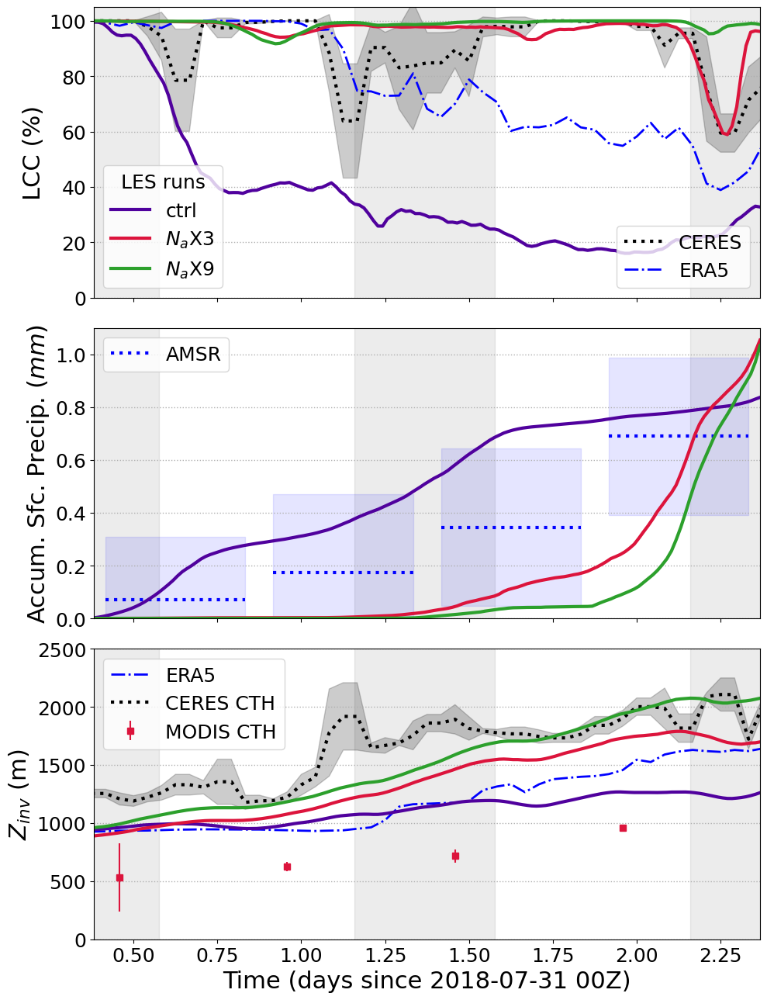

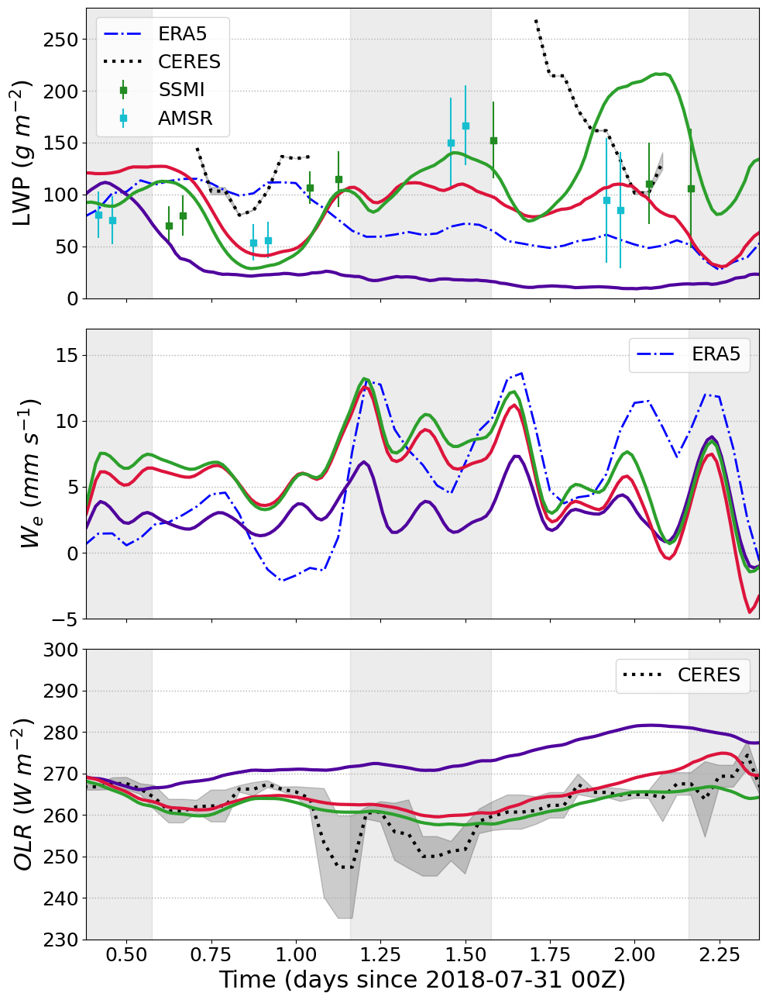

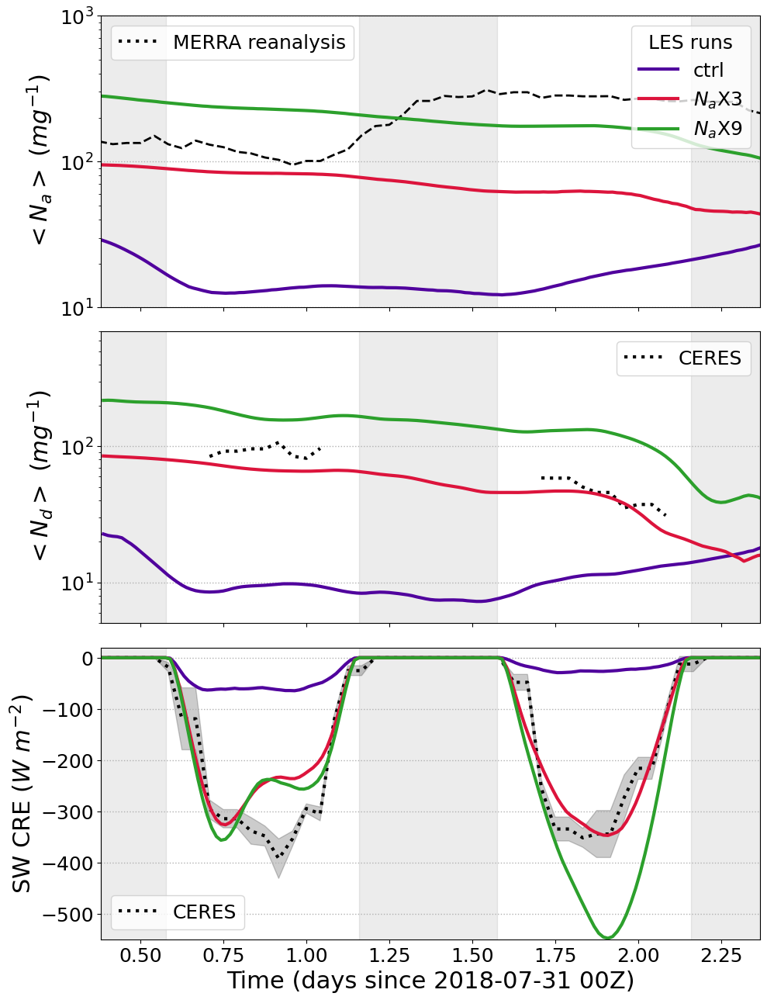

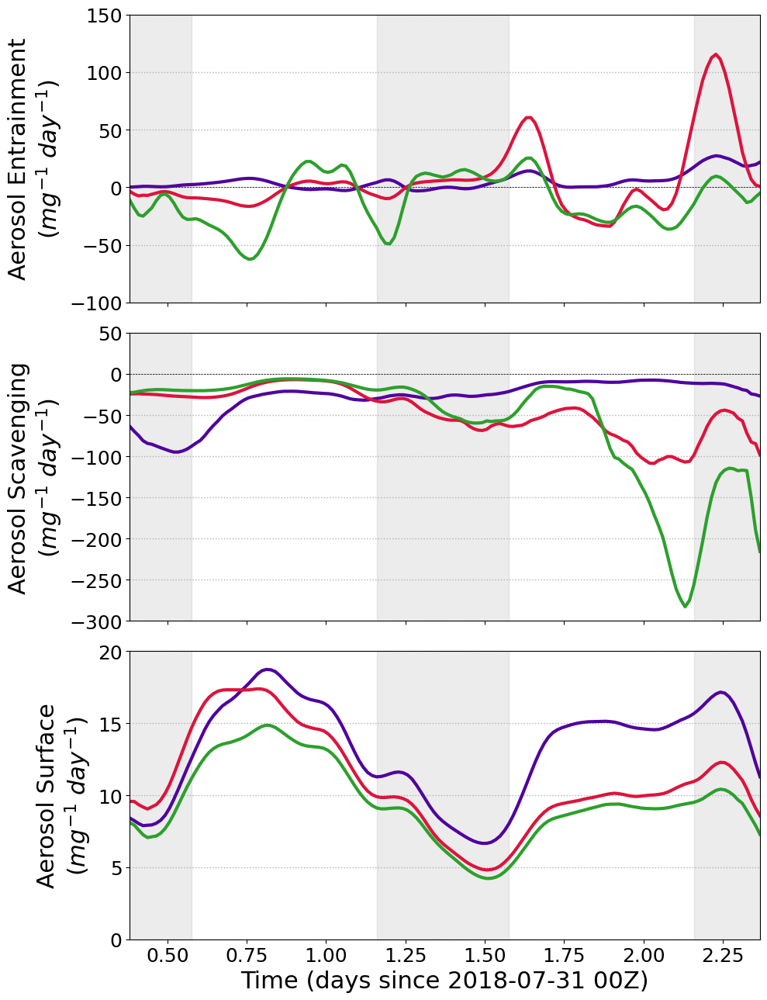

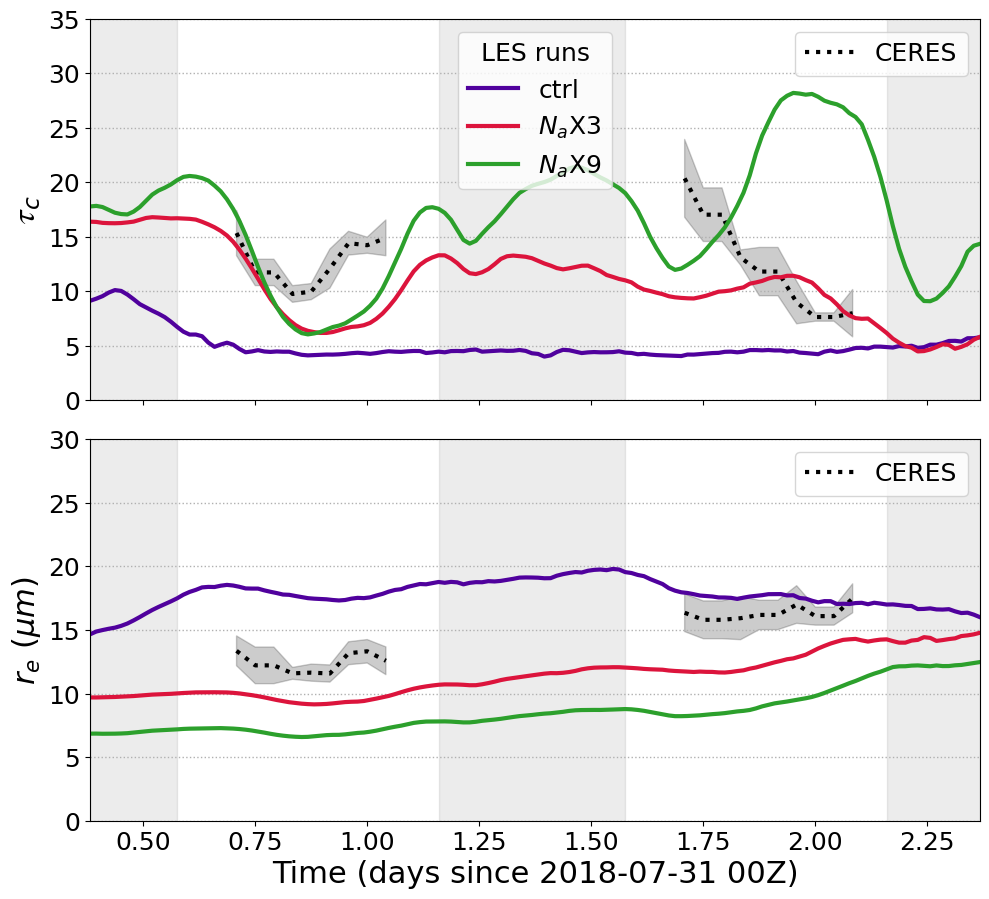

...

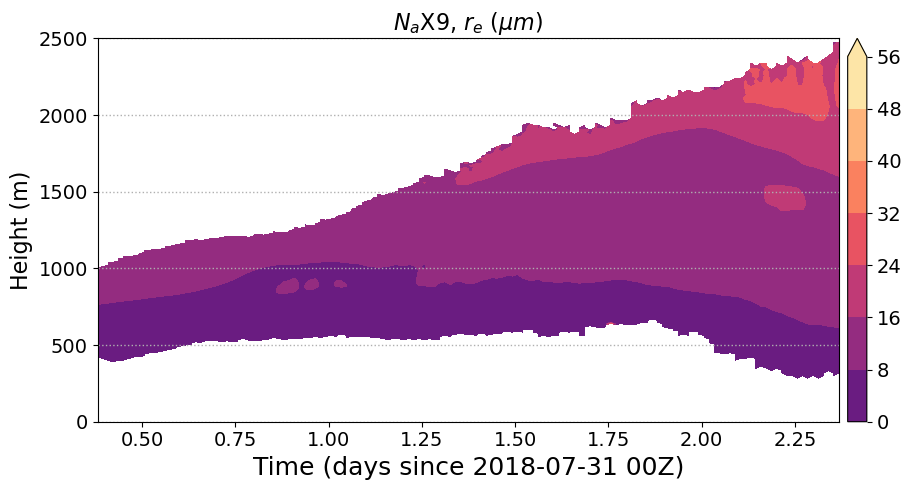

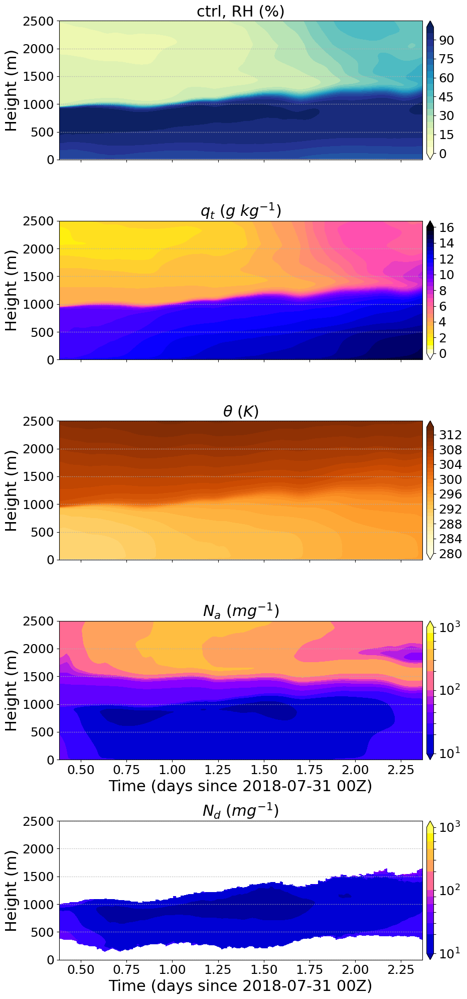

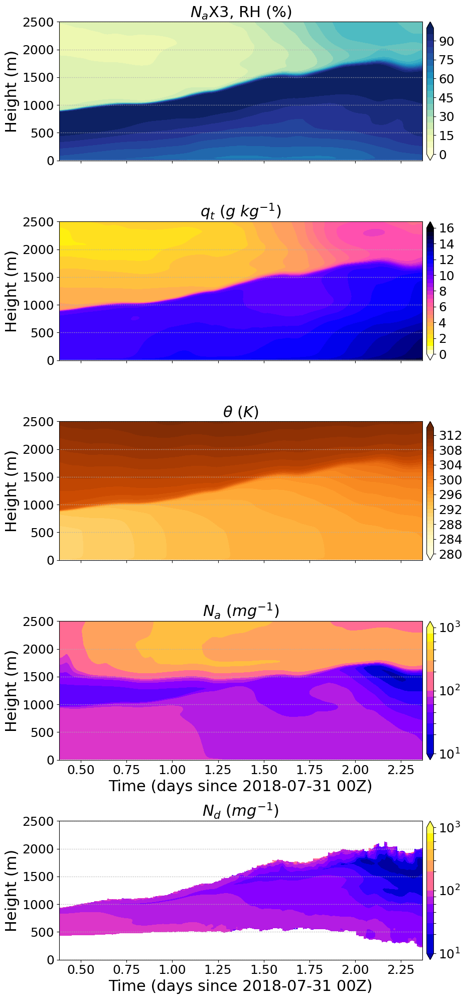

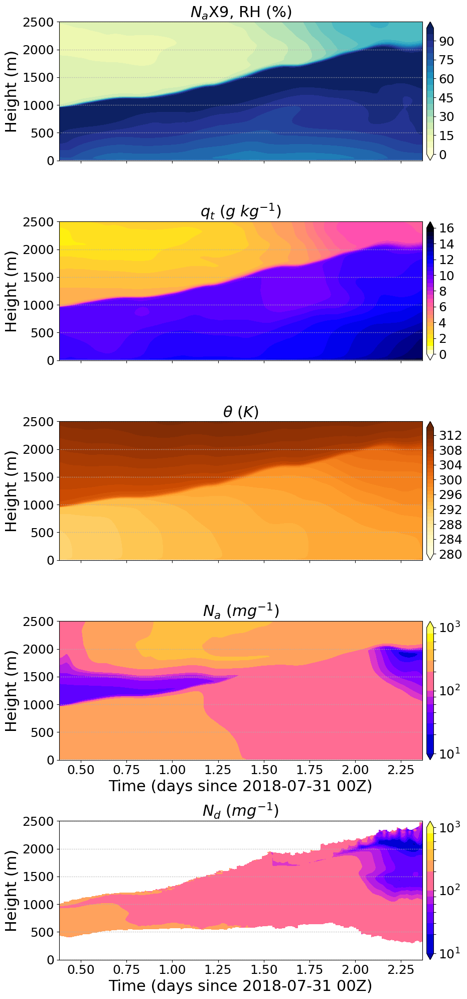

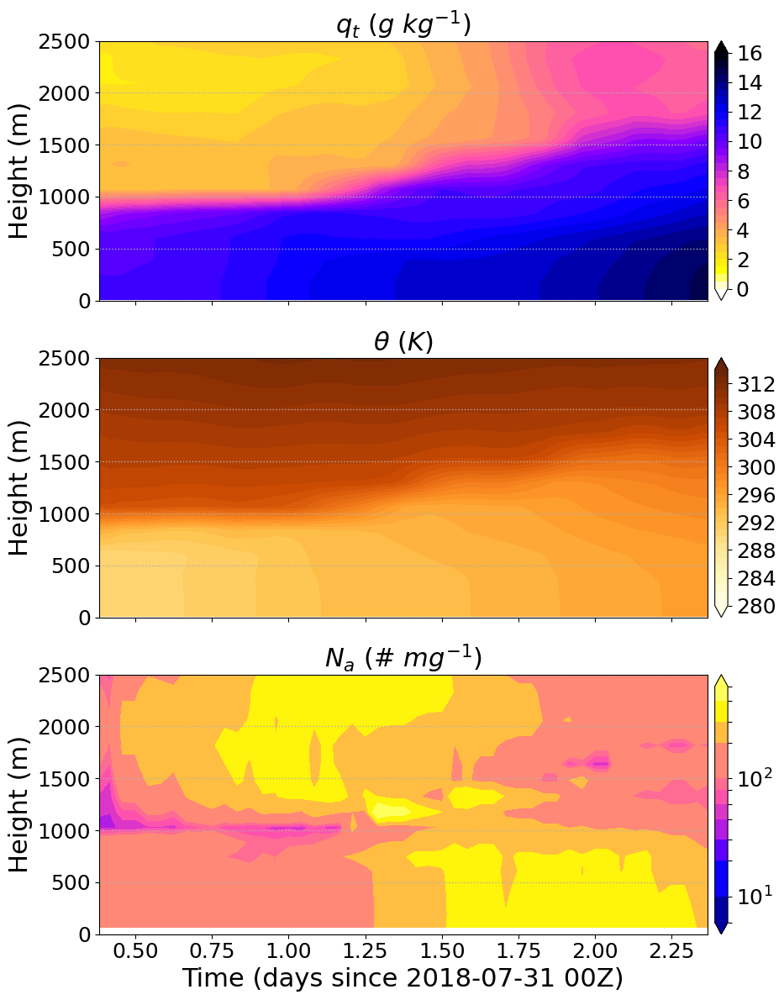

NameError: name 'tt' is not defined

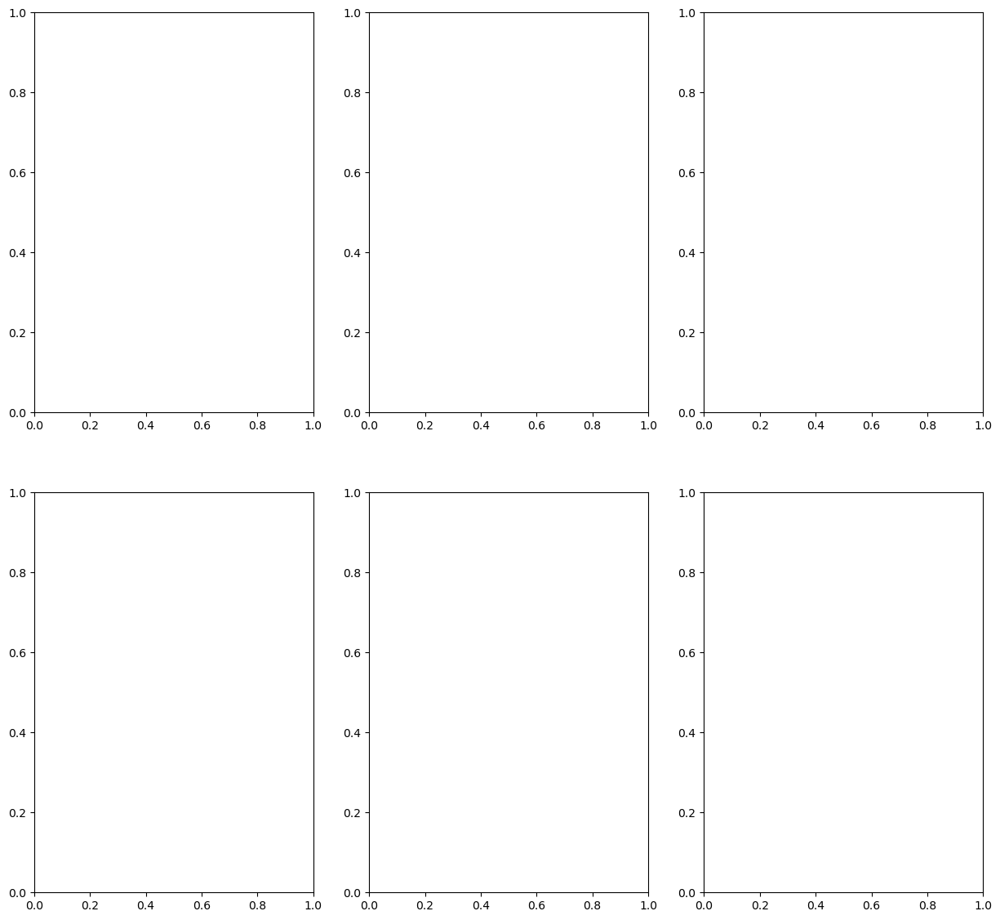

In [10]:
region   = '04'
yyyy = 2018
mm   = 7
dd   = 31 
HH   = 9 
day_tot = 2

lb = ['ctrl', '$N_a$X3', '$N_a$X9']
file1 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731.nc')
file2 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX3.nc')
file3 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX9.nc')
fn = [file1, file2, file3] #, file4] 

file3d1 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731_512.2Dbin_1.nc')
file3d2 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX3_512.2Dbin_1.nc')
file3d3 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r04_20180731/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX9_512.2Dbin_1.nc')
fn3d    = [file3d1, file3d2, file3d3] #, file3d4]

calc_stat_figs(region, yyyy, mm, dd, fn, lb, day_tot)

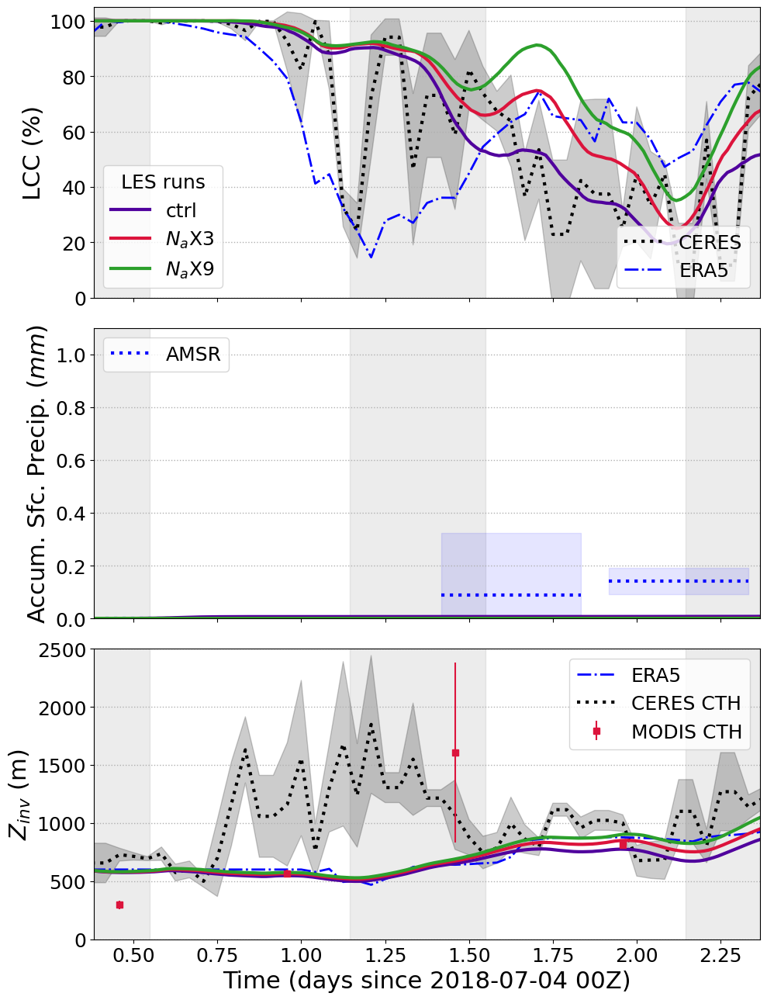

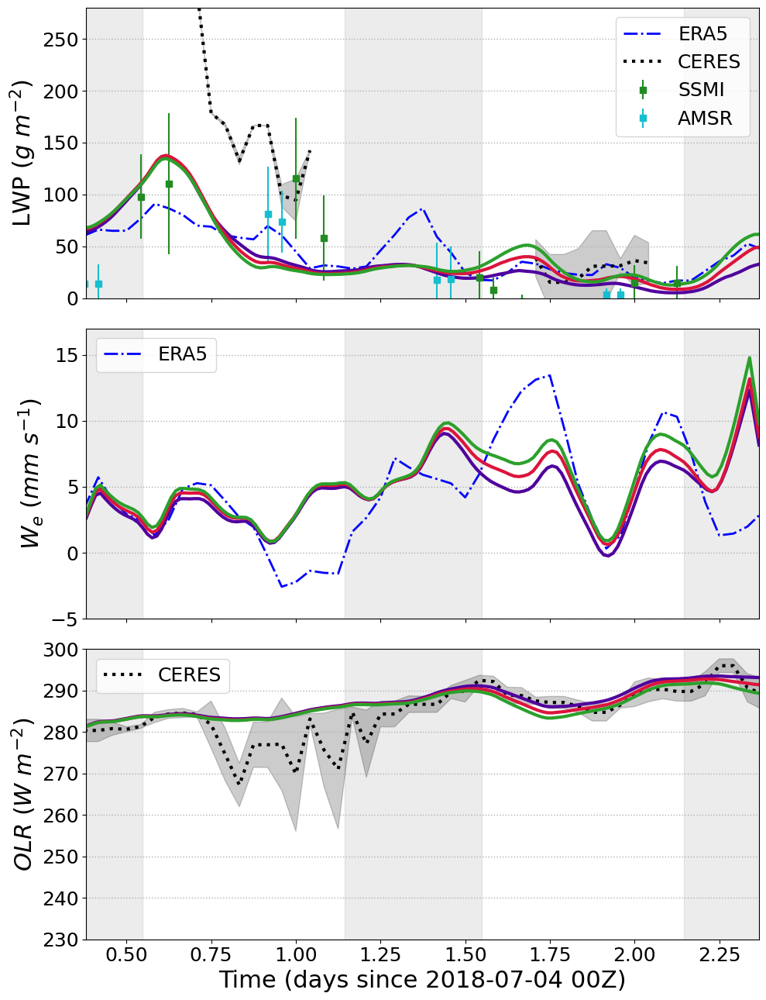

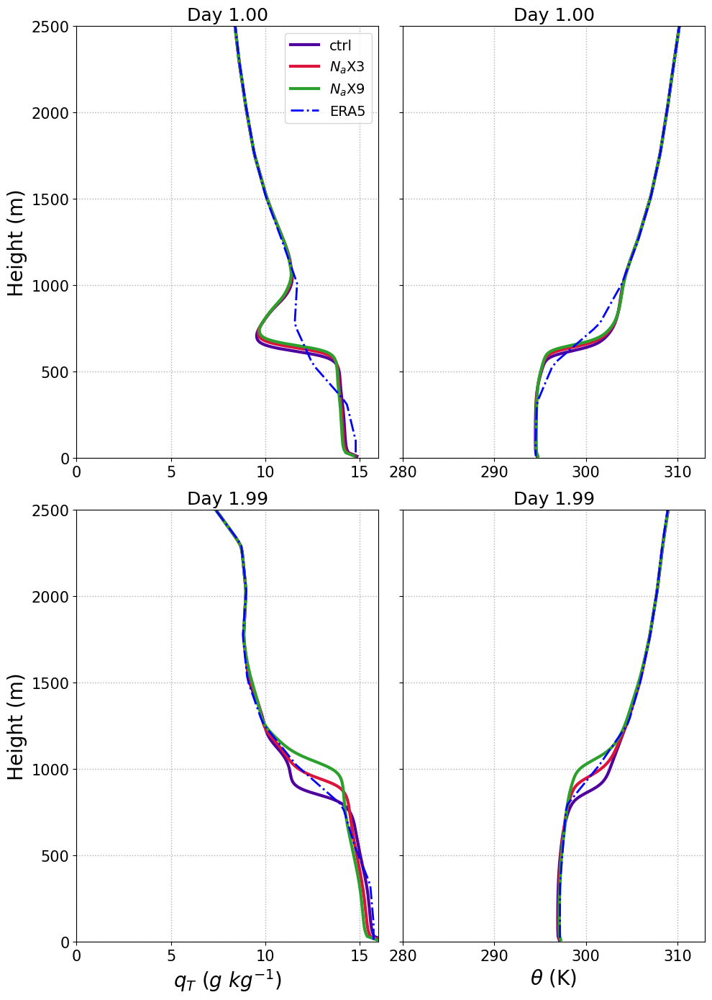

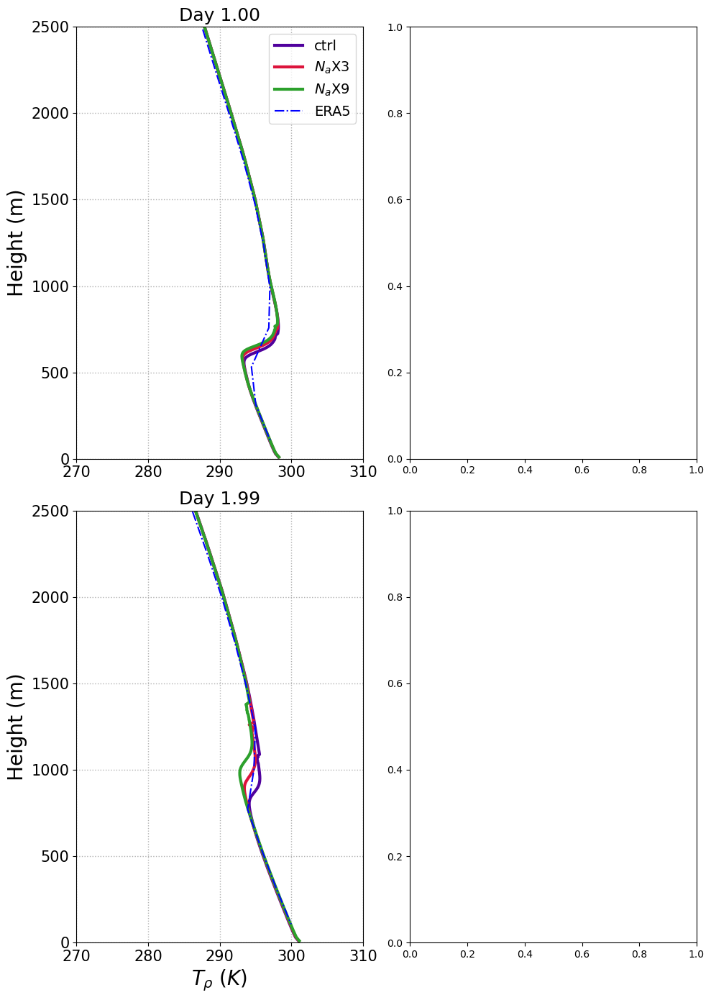

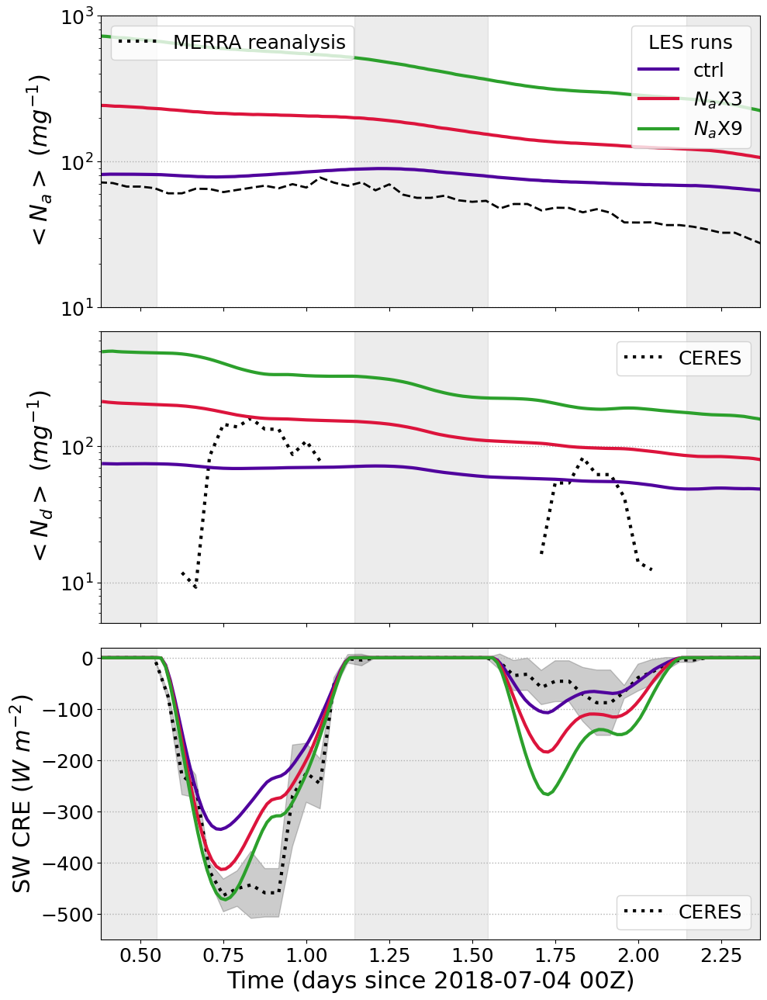

...

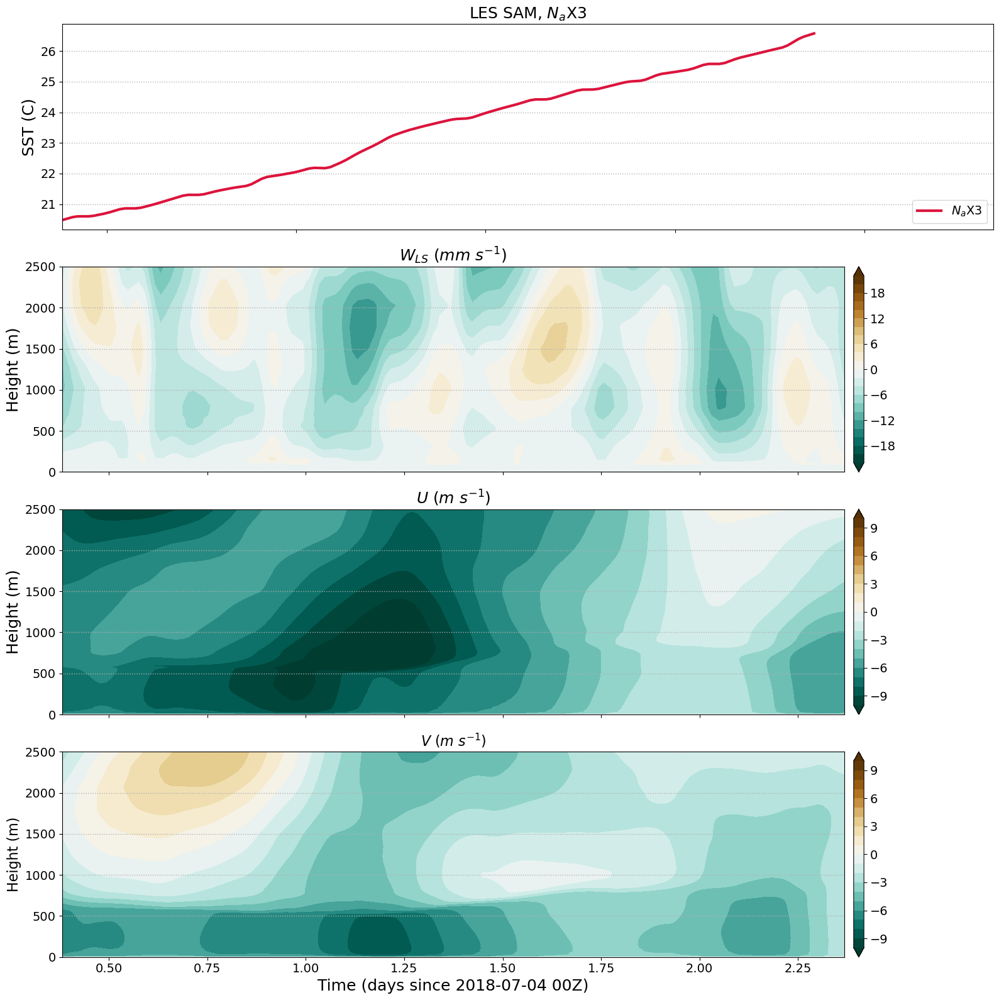

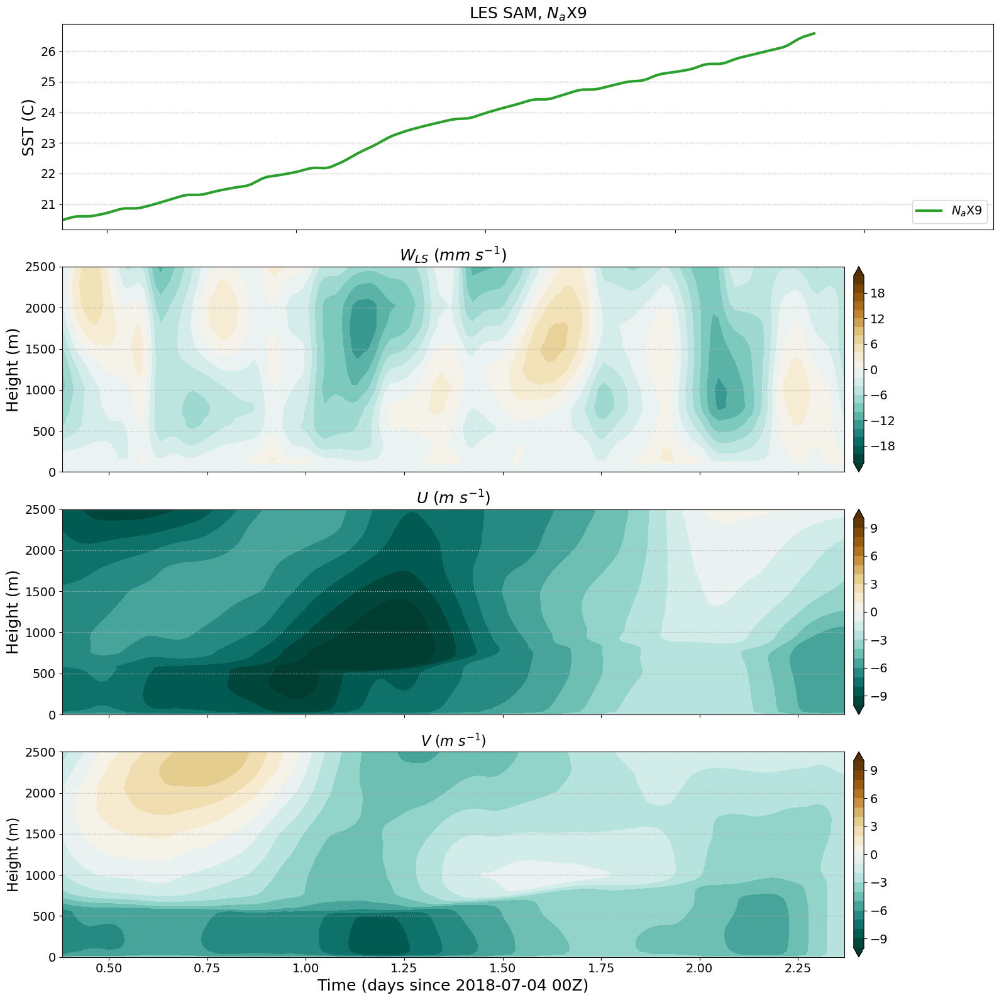

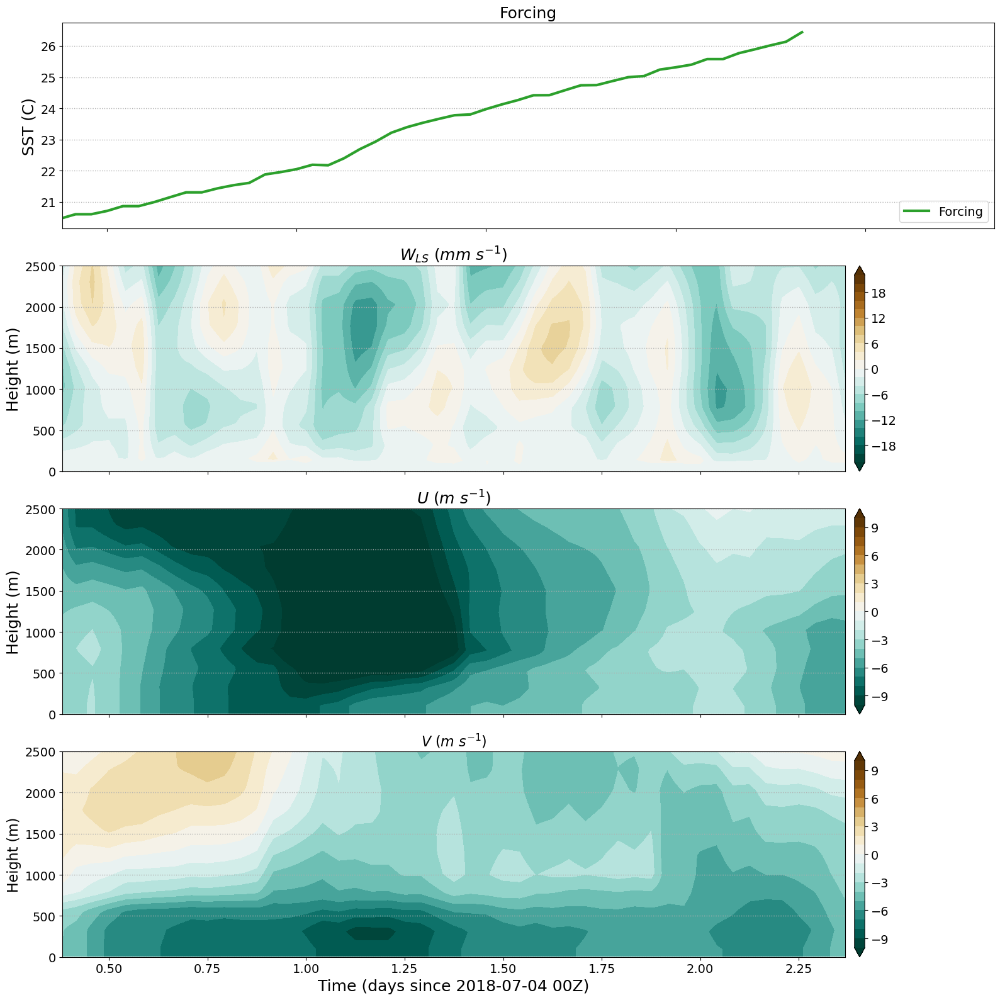

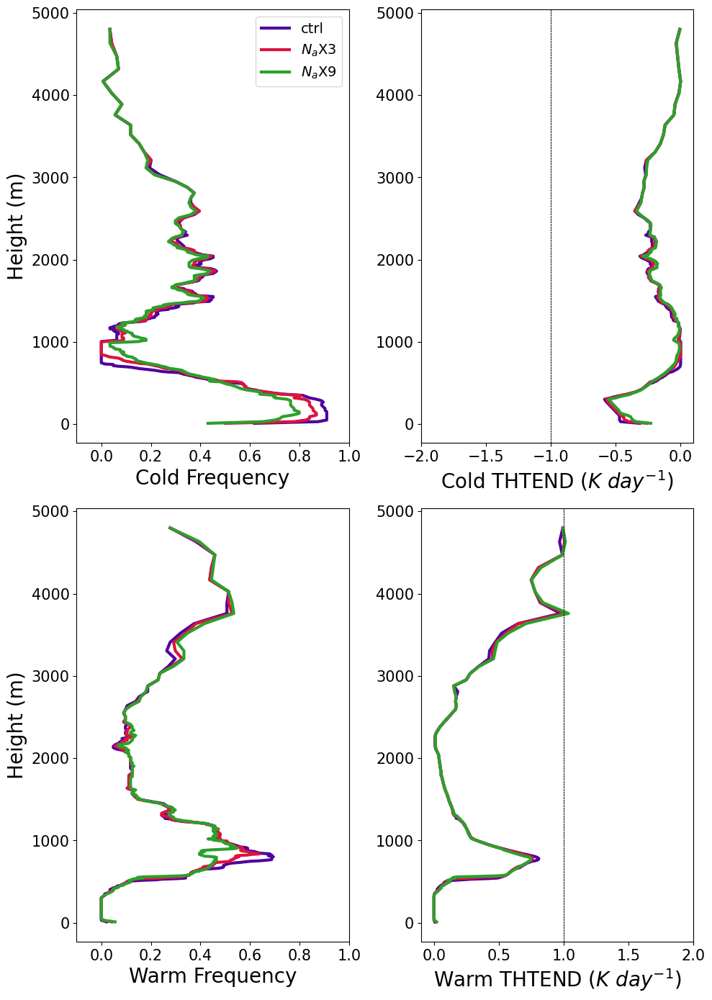

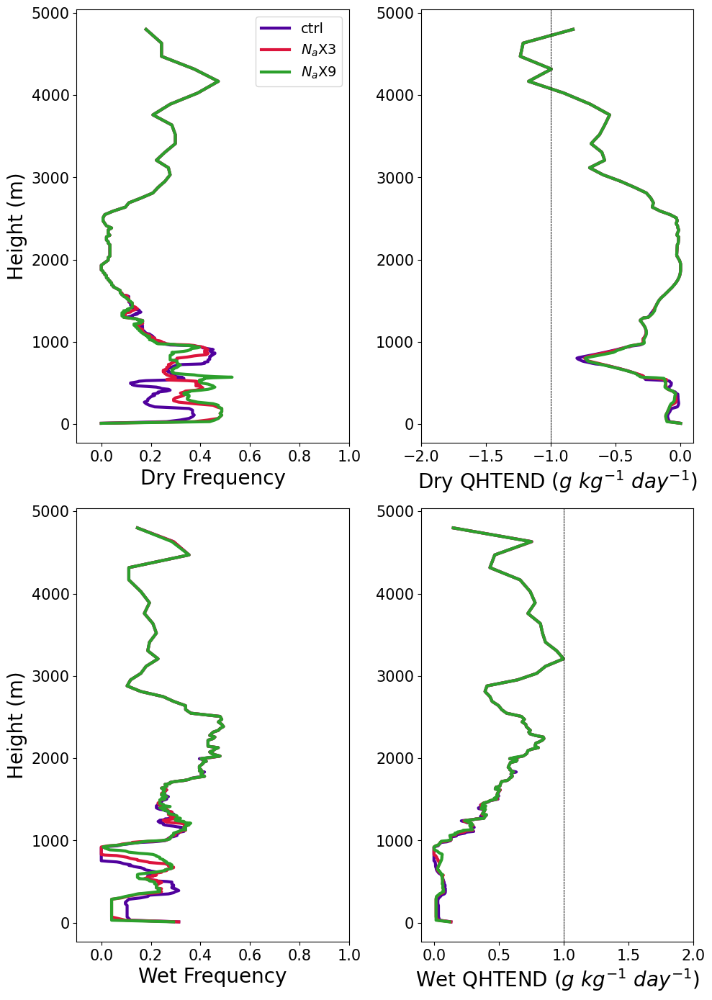

In [12]:
region   = '06'
yyyy = 2018
mm   = 7
dd   = 4 
HH   = 9 
day_tot = 2

lb = ['ctrl', '$N_a$X3', '$N_a$X9']
file1 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704.nc')
file2 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX3.nc')
file3 = Dataset('../../SAMUWgh-2023-08-18/OUT_STAT/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX9.nc')
fn = [file1, file2, file3] #, file4] 

file3d1 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704_512.2Dbin_1.nc')
file3d2 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX3_512.2Dbin_1.nc')
file3d3 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/r06_20180704/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX9_512.2Dbin_1.nc')
fn3d    = [file3d1, file3d2, file3d3]

calc_stat_figs(region, yyyy, mm, dd, fn, lb, day_tot)

## 2-D maps

In [18]:
def calc_2d_maps(region, yyyy, mm, dd, fn3d, lb):
    
    ########################
    casename  = 'NEP_' + region + '_' + str(yyyy) + f"{mm:02n}" + f"{dd:02n}"

#     t_init_0 = str(yyyy) + '-' + f"{mm:02n}" + '-' + f"{dd:02n}" + ' ' + f"{HH:02n}" + 'Z'    
    t_init_0 = str(yyyy) + '-' + str(mm) + '-' + str(dd) + ' ' + str(HH) + 'Z'    
    t_init  = [t_init_0, t_init_0, t_init_0, t_init_0]
    

    PANELS2 = ['i)', 'j)', 'k)', 'l)', 'm)', 'n)', 'o)', 'p)', 'q)', 'r)', 's)', 't)']

    
    ####
    column_num = len(fn3d)

    fig, axis = plt.subplots(4, column_num, figsize=(column_num*4.3+1,18))    

    #clevs2 = [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 200, 300, 400, 500, 600, 700, 800, 900, 1000]
    clevs2 = [1, 2, 3, 4.5, 6, 8, 10, 20, 30, 45, 60, 80, 100, 200, 300, 600]#, 1000]
    ticks2 = [1, 10, 100, 1000]

    for j in range(column_num):

        x     = fn3d[j].variables['x'][:] / 1000   # $km$
        y     = fn3d[j].variables['y'][:] / 1000   # $km$
        if j == 2:
            T3D   = fn3d[0].variables['time'][:]       # time: day
        else:
            T3D   = fn3d[j].variables['time'][:]       # time: day            
        QN    = fn3d[j].variables['QCPATH'][:] * 1000    # Column cloud liquid mass (vertically integrated), unit: g/m2
        QP    = fn3d[j].variables['QRPATH'][:] * 1000    # Column rain mass (vertically integrated), unit: g/m2
        t3d   = T3D - T3D[0]
        LWC3d = QN # + QP
        x_mg, y_mg = np.meshgrid(x, y) # making meshgrid
        
        try:
            T3D_2   = fn3d[1].variables['time'][:]       # time: day
        except:
            T3D_2   = fn3d[0].variables['time'][:]       # time: day
        t3d_2   = T3D_2 - T3D_2[1]
        days    = [t3d_2[-1] / 4, t3d_2[-1] / 2, 3 * t3d_2[-1] / 4, t3d_2[-1]]
        DAYS    = [str(np.round(t3d_2[-1] / 4,1)), str(np.round(t3d_2[-1] / 2,1)),\
                   str(np.round(3 * t3d_2[-1] / 4,1)), str(np.round(t3d_2[-1],1))]
        

        for i in range(len(days)):

            if column_num == 1:
                ax = axis[i]
            else:
                ax = axis[i,j]
            
#             print(i, t3d, days, days[i])
#             print( np.where( (t3d > days[i] - 0.01) & (t3d < days[i] + 0.01) ) )
            try:
                idx = np.where( (t3d > days[i] - 0.01) & (t3d < days[i] + 0.01) )[0][0]
            except:
                idx = np.where( (t3d > days[i] - 0.01) & (t3d < days[i] + 0.01) )[0]
#             print (idx,  np.where( (t3d > days[i] - 0.01) & (t3d < days[i] + 0.01) ))
#             if idx == []:
#             print(t3d, days, i)
            cc2 = ax.contourf(x_mg, y_mg, LWC3d[idx,:,:], clevs2, cmap = 'magma', extend='max', norm=matplotlib.colors.LogNorm())
            ax.tick_params(axis='both', which='major', labelsize=18)
            if i == 0:
                ax.set_title(lb[j] + '\n' + PANELS2[i+j*4] + ' Day ' + DAYS[i] + ' (since ' + t_init[j] + ')', fontsize = '18')                            
            else:
                ax.set_title(PANELS2[i+j*4] + ' Day ' + DAYS[i] + ' (since ' + t_init[j] + ')', fontsize = '18')
            #if j == len(fn3d) - 1:
            #    cb2 = plt.colorbar(cc2, ax=ax, pad = 0.01, ticks = ticks2, norm=matplotlib.colors.LogNorm()) # ax = ax,
            if j == 0:
                ax.set_ylabel('Y ($km$)', fontsize = '22')
            else:
                ax.axes.get_yaxis().set_ticklabels([])        
            if i == len(days) - 1:
                ax.set_xlabel('X ($km$)', fontsize = '22')
            else:
                ax.axes.get_xaxis().set_ticklabels([])      


    fig.subplots_adjust(right=1.5)
    cbar_ax = fig.add_axes([1.01, 0.25, 0.02, 0.5])
    cbar = fig.colorbar(cc2, cax=cbar_ax)
    cbar.ax.tick_params(labelsize=18)
    cbar.ax.set_ylabel('LWP ($g$ $m^{-2}$)', fontsize = 22, labelpad=15) #rotation=270, 

    plt.tight_layout(w_pad=1)
    plt.savefig('morphology_active.png' , format='png', dpi=300)    
    plt.show()


    ###############################################################
    color2= ['forestgreen', 'hotpink', 'deepskyblue', 'darkgoldenrod'] #, 'hotpink', 'deepskyblue', 'darkgoldenrod']

    ###
    ii = 0
    diff  = [20, 5]
    bullet = [30, 30, 30, 30, 30, 30]
    ####
    wndw = 3
    def var_prep(var, wndw):
        return np.reshape( np.log10(np.nanmean(var[idx - (wndw-1):idx + (wndw-1),:,:], 0)), -1)

    def var_prep_nolog(var, wndw):
        return np.reshape( np.nanmean(var[idx - (wndw-1):idx + (wndw-1),:,:], 0), -1)

    #####
    def hist_bins(var1, var2, diff):
        bins = np.arange(np.nanmin(var1), np.nanmax(var1) + diff, diff)
        bins2= []
        for i in range(len(bins) - 1):
            bins2.append( (bins[i] + bins[i+1]) / 2 )
        bins2 = np.array(bins2)
        out  = bins2.copy()
        out[:] = np.nan
        for i in range(len(bins2)):
            idx    = np.where((var1 >= bins[i]) & (var1 < bins[i+1]))
            try:
                tmp1 = var2[idx]
                tmp2 = tmp1[tmp1 > 0]
                if len(tmp2) > 1000:
                    out[i] = np.nanmean(tmp2)
#                 print(len(tmp1), len(tmp2))
            except:
                pass    
        return bins2, out


    PANELS1 = ['a)', 'b)', 'c)', 'd)', 'e)', 'f)', 'g)', 'h)']

    CC_1 = []
    NN_1 = []

    #####
    column_num = len(fn3d)

    fig, axis = plt.subplots(4, 2, figsize=(11,20))    

    for ii in range(column_num):

        if j == 2:
            T3D   = fn3d[0].variables['time'][:]       # time: day
        else:
            T3D   = fn3d[j].variables['time'][:]       # time: day          
        NCQCPATH = fn3d[ii].variables['NCQCPATH'][:]  # Column integral of QC*NC (useful for computing mass-weighted NC): kg/kg/m2
        QCPATH   = fn3d[ii].variables['QCPATH'][:]  # Column cloud liquid mass (vertically integrated), unit: kg/m2
        Prec     = fn3d[ii].variables['Prec'][:]    # Surface Precip. Rate, unit: mm/day
        ZC       = fn3d[ii].variables['ZC'][:] * 1000 # Cloud top height (Instantaneous): converted to m
        ZC[ZC == 0] = np.nan
        CDNC  = NCQCPATH / QCPATH 
        CDNC  = CDNC * 1e-6    # #/mg
        CWP   = QCPATH * 1000  # g/m2
        t3d   = T3D - T3D[0]

        try:
            T3D_2   = fn3d[j].variables['time'][:]       # time: day
        except:
            T3D_2   = fn3d[0].variables['time'][:]       # time: day
        t3d_2   = T3D_2 - T3D_2[1]
        days    = [t3d_2[-1] / 4, t3d_2[-1] / 2, 3 * t3d_2[-1] / 4, t3d_2[-1]]
        DAYS    = [str(np.round(t3d_2[-1] / 4,1)), str(np.round(t3d_2[-1] / 2,1)),\
                   str(np.round(3 * t3d_2[-1] / 4,1)), str(np.round(t3d_2[-1],1))]
        

        for i in range(len(days)):

            for j in range(2):

                ax = axis[i,j]

                ax.set_title('Day ' + str(DAYS[i]), fontsize=22)
                ax.tick_params(axis='both', which='major', labelsize=18)
                ax.grid(linestyle=':', axis='y', linewidth=1)
                ax.set_yscale('log')
                ax.text(0.1, 1.1, PANELS1[i+j*4], transform=ax.transAxes, fontsize=22, fontweight='bold', va='top', fontfamily='serif', ha='right')
                ax2 = ax.twinx()
                ax2.set_yscale('log')
                ax2.tick_params(labelsize=18)
                ax2.set_ylim([1e-2, 1e1])                


                idx = np.where((t3d > days[i] - .01) & (t3d < days[i] + .01))[0][0]

                if j == 0:
                    if i == len(days) - 1:
                        ax.set_xlabel('$LWP$ ($g$ $m^{-2}$)', fontsize=22)
                    var  = var_prep_nolog(CWP, wndw) #(np.log10(CWP[idx,:,:]), -1)
                    var2 = var_prep_nolog(Prec, wndw)
                    var[var.mask == True] = np.nan
                    CC_1.append( np.nanmean(var) )
                    bins2, out = hist_bins(var, var2, diff[j])                
                    ax.set_xlim([-10, 400])
                    ax.set_ylim([1e-4, 2e1])
                    ax.set_ylabel('PDF', fontsize=22)

                elif j == 1:
                    if i == len(days) - 1:
                        ax.set_xlabel('$<N_d>$ ($mg^{-1}$)', fontsize=22)
                    var = var_prep_nolog(CDNC, wndw) # np.reshape(np.log10(CWP[idx,:,:] / CDNC[idx,:,:]), -1)
                    var2 = var_prep_nolog(Prec, wndw)
                    var[var.mask == True] = np.nan
                    NN_1.append( np.nanmean(var) )
                    bins2, out = hist_bins(var, var2, diff[j])
                    if region == '06' and yyyy == 2018:
                        ax.set_xlim([-20, 450])
                    elif region == '04' and yyyy == 2018:
                        ax.set_xlim([-20, 250])                        
                    ax.set_ylim([1e-4, 1e1])
                    ax.set_ylabel('', fontsize=1)                 
                    if ii == column_num - 1:
                        ax2.set_ylabel('Precip. ($mm$ $day^{-1}$)', fontsize=22)                    

                pdf = sns.distplot(var, color=color2[ii], ax=ax, label=lb[ii], kde_kws=dict(linewidth=.00))#, kde = False, ylabel='PDF')
                ax.scatter(bins2, out, color=color2[ii], s=bullet[ii])
                if i ==0 and j == 1:
                    ax.legend(fontsize=15, loc='upper left')

#     for i in range(4):    
#         bbx1 = str( int(CC_1[i]) )

#         axis[i,0].text(0.95, .97, bbx1, transform=axis[i,0].transAxes, fontsize=17, va='top', fontfamily='serif',\
#                        ha='right', bbox=dict(facecolor='none', edgecolor='k'))
#         bbx1 = str( int(NN_1[i]) )
#         axis[i,1].text(0.95, .97, bbx1, transform=axis[i,1].transAxes, fontsize=17, va='top', fontfamily='serif',\
#                        ha='right', bbox=dict(facecolor='none', edgecolor='k'))
        
    for i in range(4):
        if len(fn3d) == 1:
            bbx1 = str( int(CC_1[i]) )
        elif len(fn3d) == 2:
            bbx1 = str( int(CC_1[i]) ) + '\n' + str( int(CC_1[i+4]) )
        elif len(fn3d) == 3:
            bbx1 = str( int(CC_1[i]) ) + '\n' + str( int(CC_1[i+4]) ) + '\n' + str( int(CC_1[i+8]) )
        elif len(fn3d) == 4:
            bbx1 = str( int(CC_1[i]) ) + '\n' + str( int(CC_1[i+4]) ) + '\n' + str( int(CC_1[i+8]) ) + '\n' + str( int(CC_1[i+12]) )
            

        axis[i,0].text(0.95, .97, bbx1, transform=axis[i,0].transAxes, fontsize=17, va='top', fontfamily='serif',\
                       ha='right', bbox=dict(facecolor='none', edgecolor='k'))

        if len(fn3d) == 1:
            bbx1 = str( int(NN_1[i]) )
        elif len(fn3d) == 2:
            bbx1 = str( int(NN_1[i]) ) + '\n' + str( int(NN_1[i+4]) )
        elif len(fn3d) == 3:
            bbx1 = str( int(NN_1[i]) ) + '\n' + str( int(NN_1[i+4]) ) + '\n' + str( int(NN_1[i+8]) )
        elif len(fn3d) == 4:
            bbx1 = str( int(NN_1[i]) ) + '\n' + str( int(NN_1[i+4]) ) + '\n' + str( int(NN_1[i+8]) ) + '\n' + str( int(NN_1[i+12]) )

        axis[i,1].text(0.95, .97, bbx1, transform=axis[i,1].transAxes, fontsize=17, va='top', fontfamily='serif',\
                       ha='right', bbox=dict(facecolor='none', edgecolor='k'))        

    plt.tight_layout(w_pad=1)
    plt.savefig('PDFs_active.png' , format='png', dpi=300)    
    plt.show()
    # plt.savefig('PDF_RF06.pdf' , format='pdf', dpi=500)   

## 2024 paper: 2 cases:

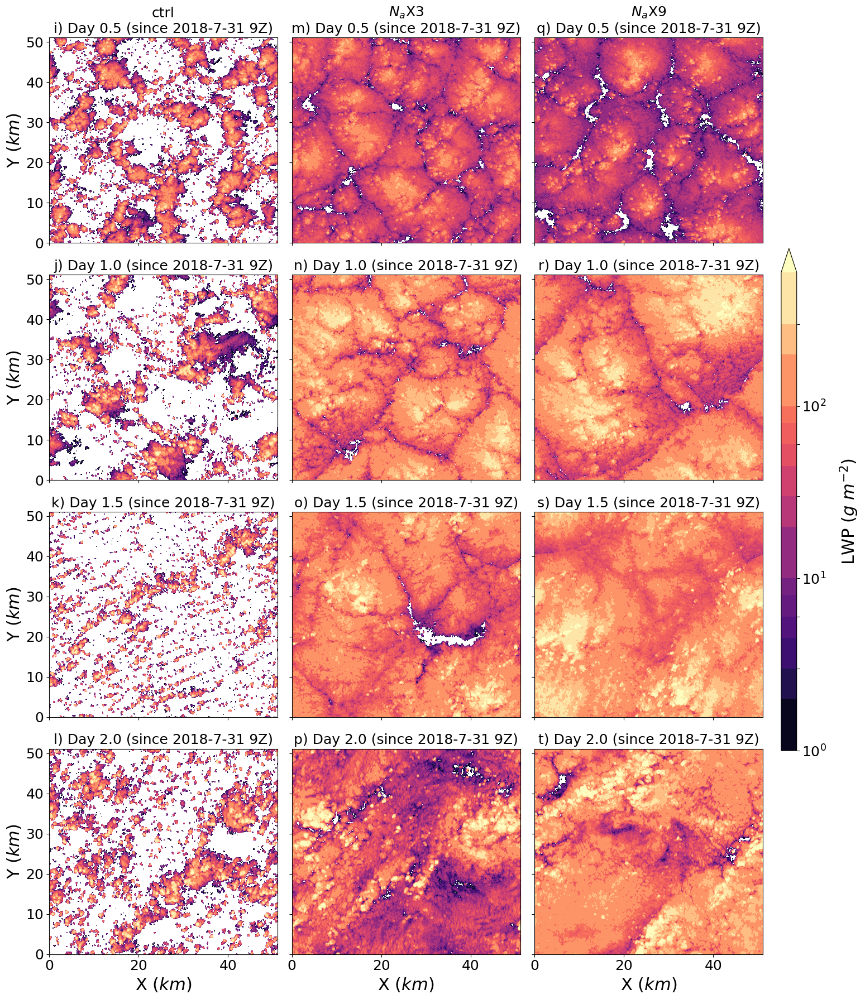

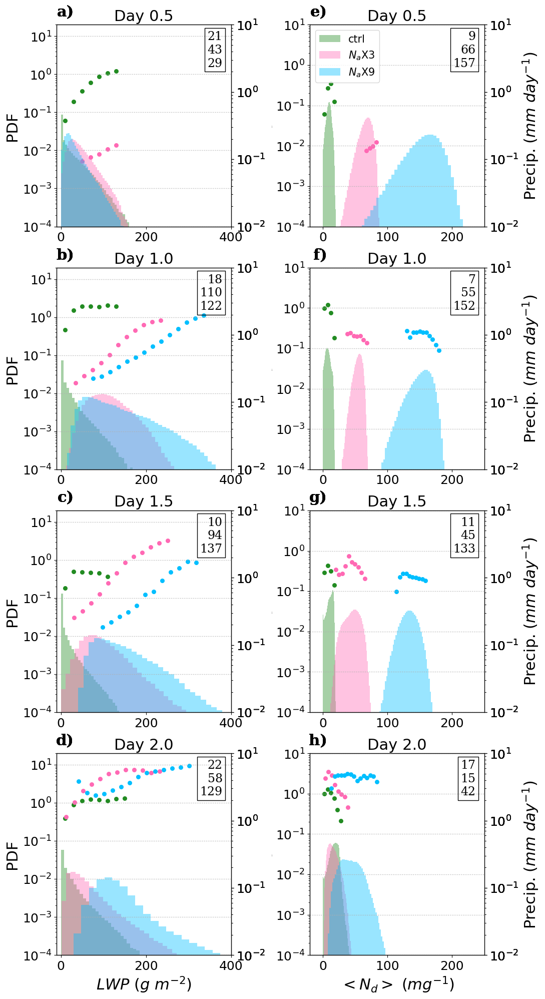

In [59]:
region   = '04'
yyyy = 2018
mm   = 7
dd   = 31 
HH   = 9 

lb = ['ctrl', '$N_a$X3', '$N_a$X9']
file3d1 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_04_20180731_512.2Dbin_1.nc')
file3d2 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX3_512.2Dbin_1.nc')
file3d3 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_04_20180731_BL_NaX9_512.2Dbin_1.nc')
fn3d    = [file3d1, file3d2, file3d3] #, file3d4]

calc_2d_maps(region, yyyy, mm, dd, fn3d, lb)

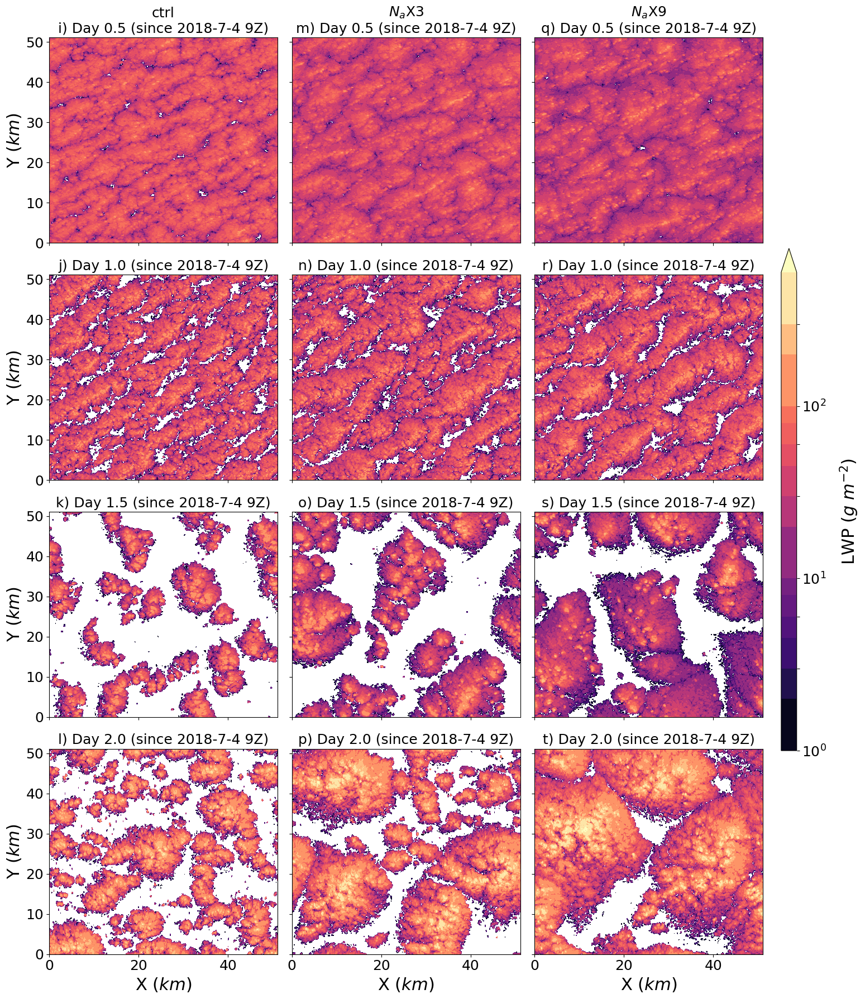

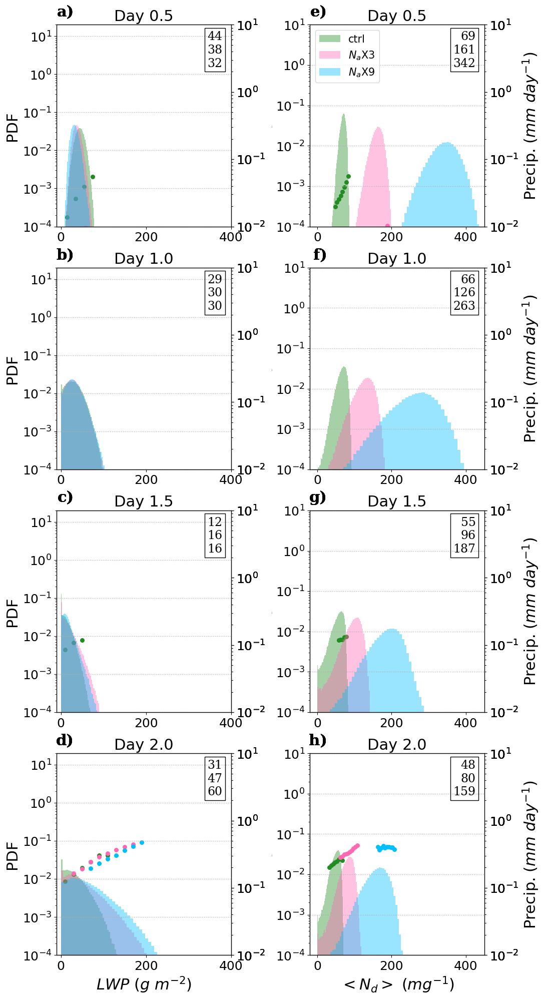

In [58]:
region   = '06'
yyyy = 2018 
mm   = 7
dd   = 4 
HH   = 9 

lb = ['ctrl', '$N_a$X3', '$N_a$X9']
file3d1 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_06_20180704_512.2Dbin_1.nc')
file3d2 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX3_512.2Dbin_1.nc')
file3d3 = Dataset('../../SAMUWgh-2023-08-18/OUT_2D/NEP_512sqx260_100m_NEP_06_20180704_BL_NaX9_512.2Dbin_1.nc')
fn3d    = [file3d1, file3d2, file3d3]

calc_2d_maps(region, yyyy, mm, dd, fn3d, lb)